## **Analysis of Posting Strategies for Higher Education Institutions**

Data Mining 2 Project by Group E:
- Adriano Chessa (201405297)
- Carlos Vilela (202203836)
- Gabriel Guimarães (201903627)
- Pedro Leite (201906697)

Table of Contents:
- **Part 1:** Introduction
- [**Part 2:** Materials](#part2)
- [**Part 3**: Pattern Analysis and HEI Grouping](#part3)
- [**Part 3A**: Pre-Processing](#part3a)
- [**Part 3B**: Exploratory Data Analysis](#part3b)
- [**Part 3C**: Clustering Analysis](#part3c)
- [**Part 4**: Content Analysis](#part4)
- [**Part 4A**: Pre-Processing](#part4a)
- [**Part 4B**: Top TF-IDF Words](#part4b)
- [**Part 4C**: Sentiment Analysis](#part4c)
- [**Part 4D**: Emotion Recognition](#part4d)
- [**Part 4E**: Category Identification](#part4e)
- [**Part 4E1**: Approach 1](#approach1)
- [**Part 4E2.1**: Approach 2](#approach21)
- [**Part 4E2.2**: Approach 2 Extended](#approach22)
- [**Part 4E2.3**: Approach 2 with Network](#approach23)
- [**Part 4F**: Machine Learning Models ](#part4f)
- **Part 5:** Conclusion



---




# **Part 2**: Materials <a name="part2"></a>

In [ ]:
#@title Requirements


!pip3 install emoji -q
!pip3 install nrclex -q
!pip3 install text2emotion -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 431.4/431.4 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 396.4/396.4 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.8/57.8 kB 898.4 kB/s eta 0:00:00


In [ ]:
#@title Imports


import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from google.colab import drive
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import emoji
import string
from sklearn.feature_extraction.text import TfidfVectorizer
from textblob import TextBlob
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.sentiment import SentimentIntensityAnalyzer
from collections import Counter
from nrclex import NRCLex
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import silhouette_score
import text2emotion as te
from wordcloud import WordCloud
from google.colab import files
from transformers import pipeline
import spacy
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline


nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')


drive.mount('/content/drive')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).




---



# **Part 3**: Pattern Analysis and HEI Grouping <a name="part3"></a>


#  **Part 3A**: Pre-Processing <a name="part3a"></a>

- **Data Pre-Processing**: To clean, transform and add new variables.
- **Summary of the Data**: To understand the data.
- **Calculate Missing values, Outliers and Skewness**: To understand data distribution, outliers and missing values.
- **Build New Dataframe**: To group the data by HEI and build the new variables.

In [ ]:
#@title Pre-Processing


#read csv
dt = pd.read_csv('/content/drive/MyDrive/TACD/HEIs.csv')

#remove .csv from the ids
dt['id'] = dt['id'].str.replace('.csv', '', regex=False)

#remove index of tweet, since its not needed
dt.drop(columns=['tweet_id'], inplace=True)

#transform the date in 3 new attributs: month, day of the week and hours of the day
dt['date'] = dt['created_at'].str[:10]
dt['month'] = dt['created_at'].str[5:7].astype(int)
dt['date'] = pd.to_datetime(dt['date'], format='%Y-%m-%d')
dt['day_of_week'] = dt['date'].dt.day_name()
dt.drop(columns=['date'], inplace=True)
day_to_number = {'Monday': 1,
                 'Tuesday': 2,
                 'Wednesday': 3,
                 'Thursday': 4,
                 'Friday': 5,
                 'Saturday': 6,
                 'Sunday': 7}
dt['day_of_week'] = dt['day_of_week'].map(day_to_number)

dt['hour_of_day'] = dt['created_at'].str[11:13].astype(int)
dt['uct'] = dt['created_at'].str[19:]
dt['uct_offset'] = dt['uct'].str[0]
dt['uct_number'] = dt['uct'].str[1:3].astype(int)

for index, row in dt.iterrows():
    if row['uct_offset'] == '+':
        dt.at[index, 'hour_of_day'] += row['uct_number']
    else:
        dt.at[index, 'hour_of_day'] -= row['uct_number']

#add a new attribute with the size of the tweet
dt['tweet_length'] = dt['text'].str.len()

#add a new binary column that checks if the tweet has an url
dt['got_url'] = dt['urls'].notna().astype(int)

#add a new binary column that checks if the tweet has media
dt['got_media'] = dt['media_type'].notna().astype(int)

#add a new binary column that checks if the tweet has a photo
dt['got_photo'] = (dt['media_type'] == 'photo').astype(int)

#add a new binary column that checks if the tweet has a video
dt['got_video'] = (dt['media_type'] == 'video').astype(int)

#add a new column with the amount of hashtags per tweet
def count_hashtags(text):
    hashtags = re.findall(r'#\w+', text)
    return len(hashtags)

dt['hashtag_count'] = dt['text'].apply(count_hashtags)

#add a new column with the amount of emojis per tweet
emoji_pattern = re.compile(
    "["
    "\U0001F600-\U0001F64F"
    "\U0001F300-\U0001F5FF"
    "\U0001F680-\U0001F6FF"
    "\U0001F700-\U0001F77F"
    "\U0001F780-\U0001F7FF"
    "\U0001F800-\U0001F8FF"
    "\U0001F900-\U0001F9FF"
    "\U0001FA00-\U0001FA6F"
    "\U0001FA70-\U0001FAFF"
    "]+",
    re.UNICODE
)

def count_emojis(text):
    emojis = re.findall(emoji_pattern, text)
    return len(emojis)

dt['emoji_count'] = dt['text'].apply(count_emojis)

#add a new column with the amount of mentions
def count_mentions(text):
    mentions = re.findall(r'@\w+', text)
    return len(mentions)

dt['mention_count'] = dt['text'].apply(count_mentions)

#drop the row with id "complutense", since it only has 1 observation
tweets_count = dt.groupby('id').size().reset_index(name='tweets_count')
dt = dt[dt['id'] != 'complutense']


# Fill null values in 'view_count' with the median grouped by 'id'
dt.loc[:, 'view_count'] = dt.groupby('id')['view_count'].transform(lambda x: x.fillna(x.median()))


#dropping the mega outlier
condition= (dt['id'] == 'mit') & (dt['text'] == 'We did not subscribe to Twitter Blue.') & (dt['favorite_count'] == 41655)

dt= dt.drop(dt[condition].index)

In [ ]:
#@title Summary of the Data


numeric_columns = dt.select_dtypes(include=['number'])
summary = numeric_columns.describe()
print(summary)

       bookmark_count  favorite_count  retweet_count   reply_count  \
count    11726.000000    11726.000000   11726.000000  11726.000000   
mean         1.508699       57.121695      10.265137      3.690773   
std          6.976088      215.952120      36.586775     21.115333   
min          0.000000        0.000000       0.000000      0.000000   
25%          0.000000        7.000000       2.000000      0.000000   
50%          0.000000       20.000000       5.000000      1.000000   
75%          1.000000       57.000000      11.000000      3.000000   
max        418.000000     9486.000000    2139.000000   1194.000000   

         view_count         month   day_of_week   hour_of_day    uct_number  \
count  1.172600e+04  11726.000000  11726.000000  11726.000000  11726.000000   
mean   1.109809e+04      6.776991      3.624510     14.038206      0.636790   
std    3.971519e+04      3.297758      1.799069      3.642779      0.480945   
min    5.000000e+00      1.000000      1.000000      

In [ ]:
#@title Missing values, Outliers and Skewness


#missing values
missing_values_per_column = dt.isnull().sum()

#skewness
skewness = dt.select_dtypes(include=['number']).skew()

#outliers
numeric_columns = dt.select_dtypes(include=['number'])
Q1 = numeric_columns.quantile(0.25)
Q3 = numeric_columns.quantile(0.75)
IQR = Q3 - Q1
outliers = (numeric_columns < (Q1 - 1.5 * IQR)) | (numeric_columns > (Q3 + 1.5 * IQR))
outliers_count = outliers.sum()
for column in numeric_columns.columns:
    print(f"{column}:")
    print(f"Missing Values: {missing_values_per_column[column]}")
    print(f"Outliers: {outliers_count[column]}")
    print(f"Skewness: {skewness[column]}")
    print()


bookmark_count:
Missing Values: 0
Outliers: 1806
Skewness: 34.39242748007142

favorite_count:
Missing Values: 0
Outliers: 865
Skewness: 22.863283928719103

retweet_count:
Missing Values: 0
Outliers: 934
Skewness: 33.98900978525902

reply_count:
Missing Values: 0
Outliers: 1160
Skewness: 31.292682817865956

view_count:
Missing Values: 0
Outliers: 298
Skewness: 51.024364601861016

month:
Missing Values: 0
Outliers: 0
Skewness: -0.18682284623144205

day_of_week:
Missing Values: 0
Outliers: 0
Skewness: 0.19464635898603974

hour_of_day:
Missing Values: 0
Outliers: 36
Skewness: 0.17722581793676828

uct_number:
Missing Values: 0
Outliers: 0
Skewness: -0.5689354887025974

tweet_length:
Missing Values: 0
Outliers: 4
Skewness: -0.5112801730184194

got_url:
Missing Values: 0
Outliers: 0
Skewness: -1.0173754030486926

got_media:
Missing Values: 0
Outliers: 0
Skewness: 0.17362150460950693

got_photo:
Missing Values: 0
Outliers: 0
Skewness: 0.46294337608594616

got_video:
Missing Values: 0
Outliers:

In [ ]:
#@title Build New Dataframe


#calculate attributes
tweets_count = dt.groupby('id').size().reset_index(name='tweets_count')
average_length = dt.groupby('id')['tweet_length'].mean().reset_index(name='tweet_length')
average_likes = dt.groupby('id')['favorite_count'].mean().reset_index(name='average_likes')
average_retweets = dt.groupby('id')['retweet_count'].mean().reset_index(name='average_retweets')
average_replies = dt.groupby('id')['reply_count'].mean().reset_index(name='average_replies')
average_bookmarks = dt.groupby('id')['bookmark_count'].mean().reset_index(name='average_bookmarks')
average_views = dt.groupby('id')['view_count'].mean().reset_index(name='average_views')
average_urls = dt.groupby('id')['got_url'].mean().reset_index(name='average_urls')
average_media = dt.groupby('id')['got_media'].mean().reset_index(name='average_media')
average_photos = dt.groupby('id')['got_photo'].mean().reset_index(name='average_photos')
average_videos = dt.groupby('id')['got_video'].mean().reset_index(name='average_videos')
average_hashtags = dt.groupby('id')['hashtag_count'].mean().reset_index(name='average_hashtags')
average_emojis = dt.groupby('id')['emoji_count'].mean().reset_index(name='average_emojis')
average_mentions = dt.groupby('id')['mention_count'].mean().reset_index(name='average_mentions')
average_hourofday = dt.groupby('id')['hour_of_day'].mean().reset_index(name='average_hourofday')
average_dayofweek = dt.groupby('id')['day_of_week'].mean().reset_index(name='average_dayofweek')

#merge the dataframes
merged_df = tweets_count.merge(average_length, on='id', how='left')
merged_df = merged_df.merge(average_likes, on='id', how='left')
merged_df = merged_df.merge(average_retweets, on='id', how='left')
merged_df = merged_df.merge(average_replies, on='id', how='left')
merged_df = merged_df.merge(average_bookmarks, on='id', how='left')
merged_df = merged_df.merge(average_views, on='id', how='left')
merged_df = merged_df.merge(average_urls, on='id', how='left')
merged_df = merged_df.merge(average_media, on='id', how='left')
merged_df = merged_df.merge(average_photos, on='id', how='left')
merged_df = merged_df.merge(average_videos, on='id', how='left')
merged_df = merged_df.merge(average_hashtags, on='id', how='left')
merged_df = merged_df.merge(average_emojis, on='id', how='left')
merged_df = merged_df.merge(average_mentions, on='id', how='left')
merged_df = merged_df.merge(average_hourofday, on='id', how='left')
merged_df = merged_df.merge(average_dayofweek, on='id', how='left')

print(merged_df)

            id  tweets_count  tweet_length  average_likes  average_retweets  \
0         duke           690    194.720290      29.771014          5.017391   
1         epfl           593    245.733558      19.384486          4.701518   
2          goe           149    289.221477      14.241611          5.020134   
3      harvard          2016    162.983631     145.388889         23.958829   
4    leicester          1234    255.085089      10.495138          2.374392   
5   manchester          1385    171.438989      11.478700          3.238267   
6          mit          1045    228.155981     105.705263         21.755981   
7           sb           713    204.656381      16.151473          3.478261   
8     stanford           349    188.166189     186.169054         28.289398   
9      trinity           962    249.914761      26.297297          6.798337   
10          wv           887    143.992108      62.977452          6.591883   
11        yale          1703    235.508514      26.7



---



#   **Part 3B**: Exploratory Data Analysis <a name="part3b"></a>



- **Visualize the Trend of Posting**: To know at what hours and week days, they post the most.
- **Visualize the Trend of Views**: To know at what hours and week days, the posts get more views.
- **Visualize Amount of Tweets per HEI**: To know who posts the most and the less.
- **Visualize Average Length of Tweets per HEI**: To know who posts the biggest and smallest twees.
- **Visualize Average Views per HEI**: To know which ones got the most and the least views.
- **Visualize Average Interactions per HEI**: To know which ones got the most and the least interactions.
- **Visualize Average Interactions per HEI**: To know which ones got the most and the least interactions.
- **Visualize Average Content Use per HEI**: To know which ones use the mos and the least different types of content.
- **Time Series of Views**: To visualize average views trough time.
- **Time Series of Likes**: To visualize average likes trough time.
- **Type of Tweet**: To visualize the amount of each type of tweeet.
- **Type of Media**: To visualize the amount of each type of media.
- **Correlation Matrix**: To know what numerical variables are correlated between each other.

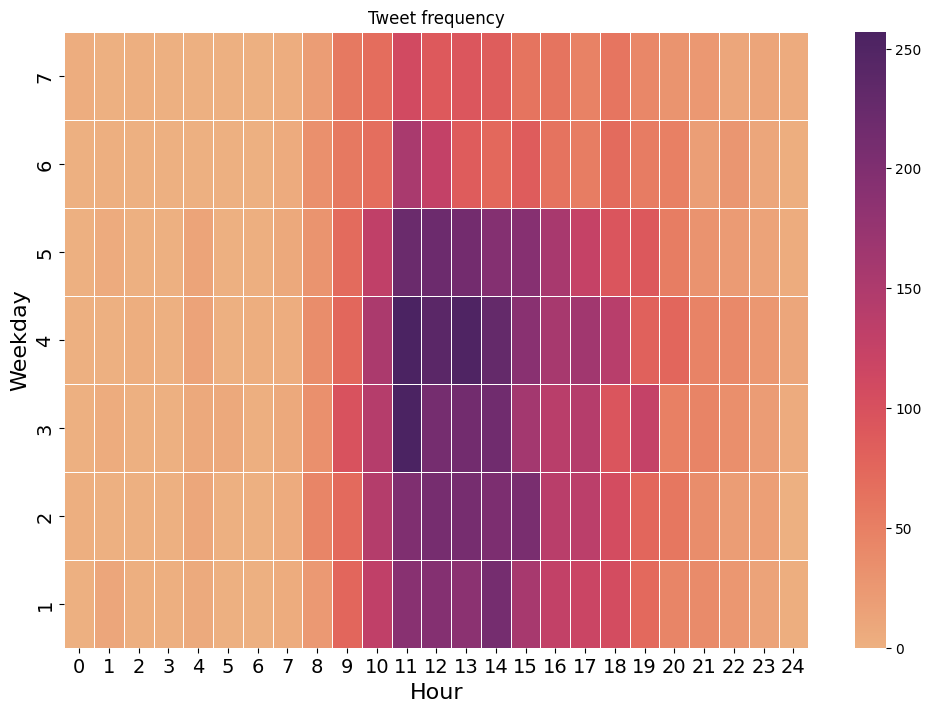

In [ ]:
#@title Trend of Posting


test= dt.pivot_table(index='day_of_week', columns='hour_of_day', aggfunc='size', fill_value=0)
test = test.reindex(index=test.index[::-1])
plt.figure(figsize=(12, 8))
sns.heatmap(test, cmap='flare', annot=False, fmt='g', linewidths=.5)
plt.title('Tweet frequency')
plt.xlabel("Hour", fontsize=16)
plt.ylabel("Weekday", fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#plt.savefig('freq_heat.png')
plt.show()

In [ ]:
#@title Mode of Publication


def mode(series):
    return series.mode().iloc[0] if not series.mode().empty else None

mode_day_of_week = dt.groupby('id')['day_of_week'].apply(mode)
mode_hour_of_day = dt.groupby('id')['hour_of_day'].apply(mode)

mode_df = pd.DataFrame({
    'day_of_week_mode': mode_day_of_week,
    'hour_of_day_mode': mode_hour_of_day
}).reset_index()

print(mode_df)

            id  day_of_week_mode  hour_of_day_mode
0         duke                 2                11
1         epfl                 4                12
2          goe                 2                12
3      harvard                 3                11
4    leicester                 4                14
5   manchester                 4                11
6          mit                 4                13
7           sb                 4                11
8     stanford                 2                12
9      trinity                 4                14
10          wv                 3                14
11        yale                 2                12


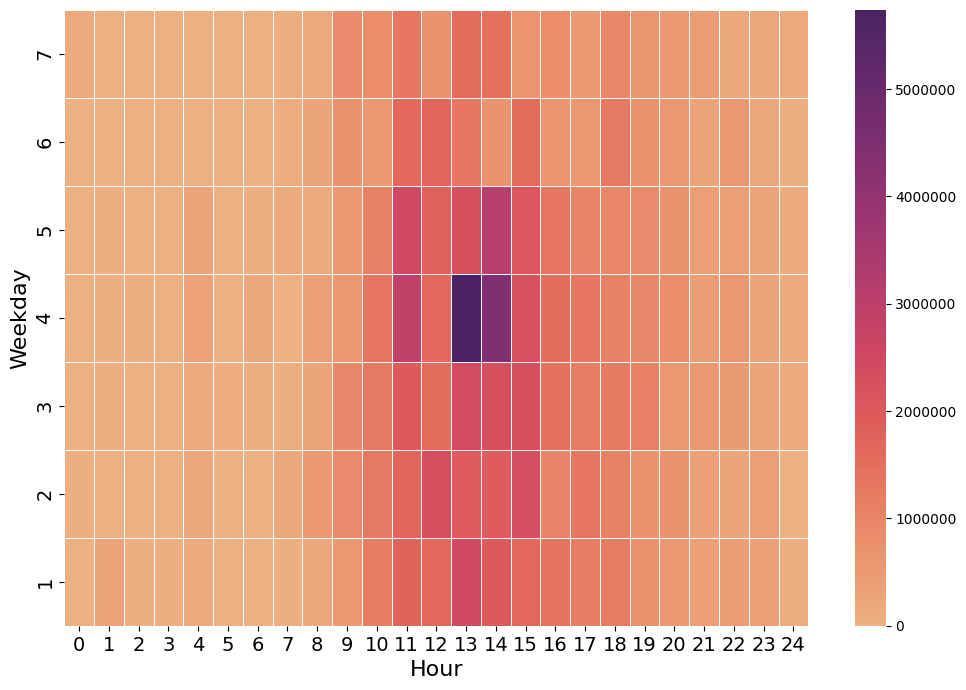

In [ ]:
#@title Trend of Views


heatmap_data = dt.pivot_table(index='day_of_week', columns='hour_of_day', values='view_count', aggfunc='sum', fill_value=0)
heatmap_data = heatmap_data.reindex(index=heatmap_data.index[::-1])
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='flare', annot=False, fmt='g', linewidths=.5, cbar_kws={"format": '%d'})
plt.xlabel('Hour', fontsize=16)
plt.ylabel('Weekday', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#plt.savefig('freq_view.png')
plt.show()

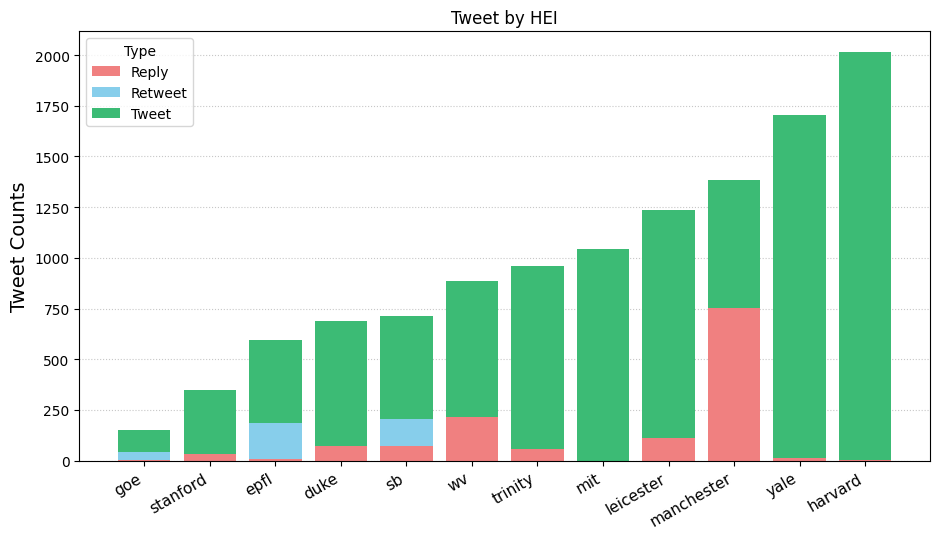

In [ ]:
#@title Amount of Tweets


tweet_counts = dt.groupby(['id', 'type']).size().unstack(fill_value=0)
sorted_df = tweet_counts.sum(axis=1).sort_values().index
tweet_counts = tweet_counts.loc[sorted_df]
fig, ax = plt.subplots(figsize=(9.5, 5.5))
bottom = pd.Series([0] * tweet_counts.shape[0], index=tweet_counts.index)
colors = ['lightcoral', 'skyblue', '#3CBB75FF']

for i, col in enumerate(tweet_counts.columns):
    plt.bar(tweet_counts.index, tweet_counts[col], bottom=bottom, label=col, color=colors[i], zorder=2)
    bottom += tweet_counts[col]

plt.title('Tweet by HEI')
plt.ylabel('Tweet Counts', fontsize=14)
plt.xticks(rotation=30, ha='right', fontsize=11)
ax.yaxis.grid(linestyle=':', alpha=0.7)
plt.legend(title='Type')
plt.tight_layout()
plt.savefig('tweets_by_hei.png')
plt.show()

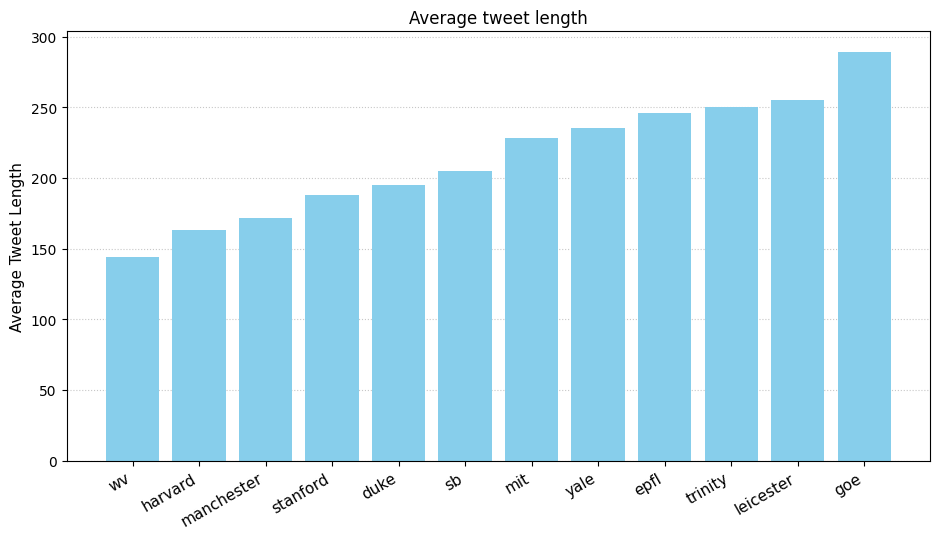

In [ ]:
#@title Average Length of Tweets


sorted_df = merged_df.sort_values(by='tweet_length')
ids = sorted_df['id']
tweet_counts = sorted_df['tweet_length']
fig, ax = plt.subplots(figsize=(9.5, 5.5))
plt.bar(ids, tweet_counts, color='skyblue', zorder= 2)
plt.title('Average tweet length')
plt.ylabel('Average Tweet Length', fontsize= 11)
plt.xticks(rotation=30, ha='right', fontsize= 11)
ax.yaxis.grid(linestyle=':', alpha=0.7)
plt.tight_layout()
plt.savefig('avg_length')
plt.show()

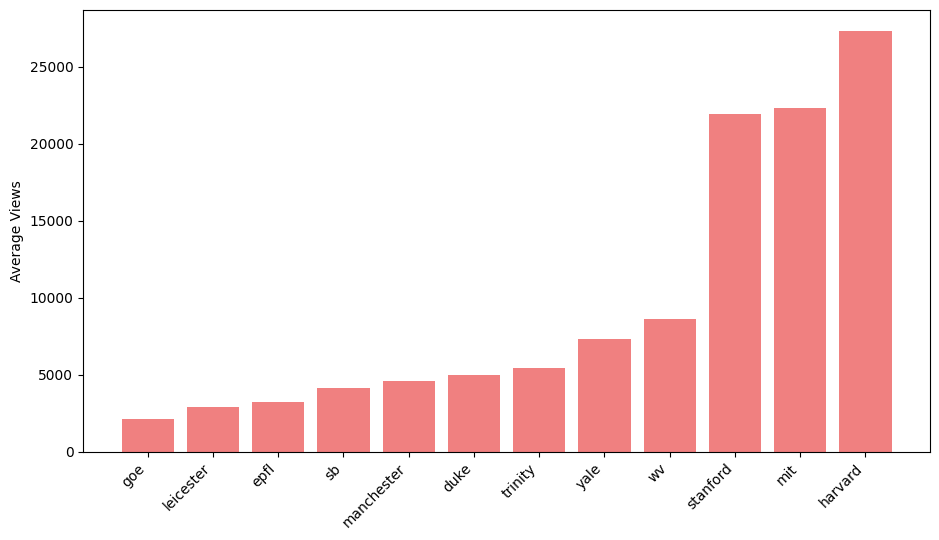

In [ ]:
#@title Average Views


sorted_df = merged_df.sort_values(by='average_views')
ids = sorted_df['id']
tweet_counts = sorted_df['average_views']
plt.figure(figsize=(9.5, 5.5))
plt.bar(ids, tweet_counts, color='lightcoral')
plt.ylabel('Average Views')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

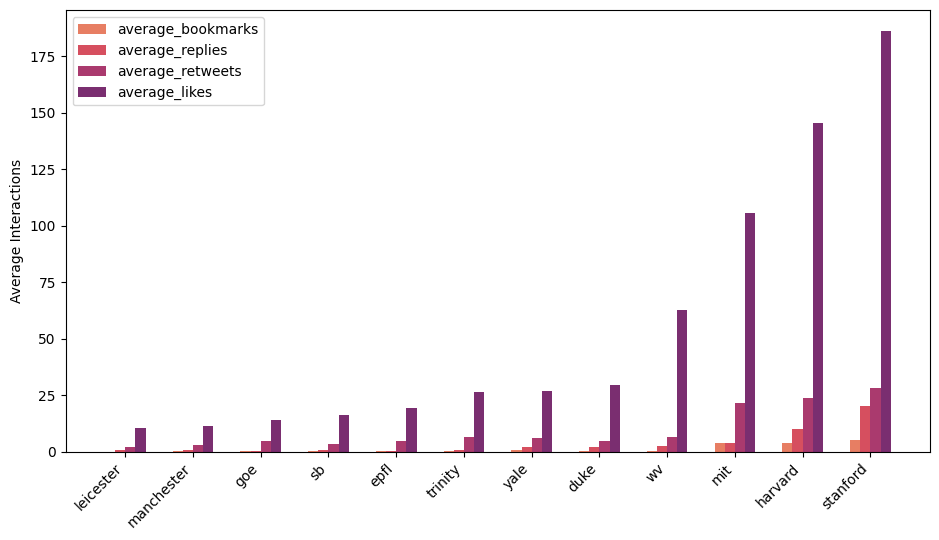

In [ ]:
#@title Average Interactions


metrics = ['average_bookmarks', 'average_replies', 'average_retweets','average_likes']
sorted_df = merged_df.sort_values(by='average_likes')
ids = sorted_df['id']
values = sorted_df[metrics].values.T
num_metrics = len(metrics)
bar_width = 0.15
fig, ax = plt.subplots(figsize=(9.5, 5.5))
colors = sns.color_palette('flare', num_metrics)

for i in range(num_metrics):
    ax.bar(np.arange(len(ids)) + i * bar_width, values[i], bar_width, label=metrics[i], color=colors[i])

ax.set_ylabel('Average Interactions')
ax.set_xticks(np.arange(len(ids)) + bar_width * (num_metrics - 1) / 2)
ax.set_xticklabels(ids, rotation=45, ha='right')
ax.legend()
plt.tight_layout()
plt.show()

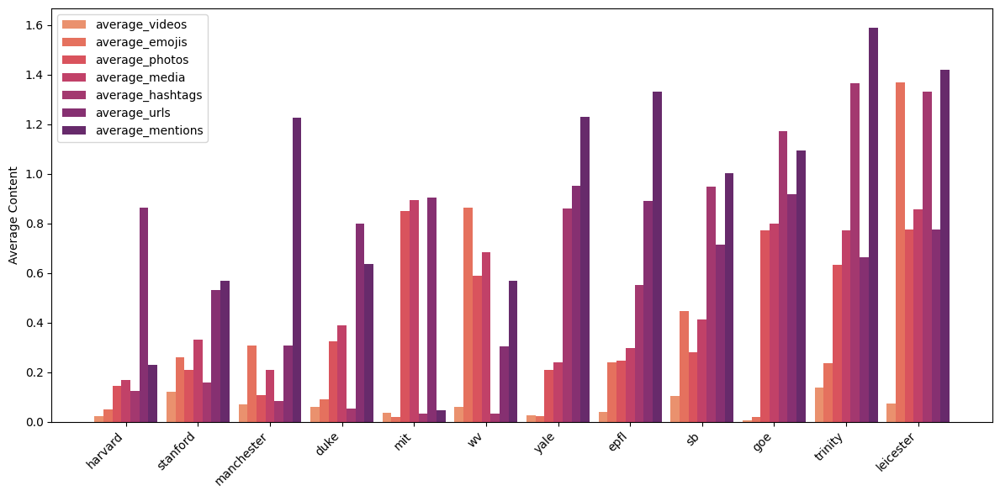

In [ ]:
#@title Average Content


metrics = ['average_urls', 'average_media', 'average_photos', 'average_videos', 'average_hashtags', 'average_emojis', 'average_mentions']
average_values = merged_df[metrics].mean()
metrics_sorted = sorted(metrics, key=lambda x: average_values[x])
merged_df['sum_metrics'] = merged_df[metrics].sum(axis=1)
sorted_df = merged_df.sort_values(by='sum_metrics')


ids = sorted_df['id']
values = sorted_df[metrics_sorted].values.T
num_metrics = len(metrics_sorted)
bar_width = 0.15
fig, ax = plt.subplots(figsize=(12, 6))
positions = np.arange(len(ids)) * (num_metrics + 1) * bar_width
colors = sns.color_palette('flare', num_metrics)

for i in range(num_metrics):
    ax.bar(positions + i * bar_width, values[i], bar_width, label=metrics_sorted[i], color=colors[i])

ax.set_ylabel('Average Content')
ax.set_xticks(positions + (num_metrics - 1) * bar_width / 2)
ax.set_xticklabels(ids, rotation=45, ha='right')
ax.legend()
plt.tight_layout()
plt.show()

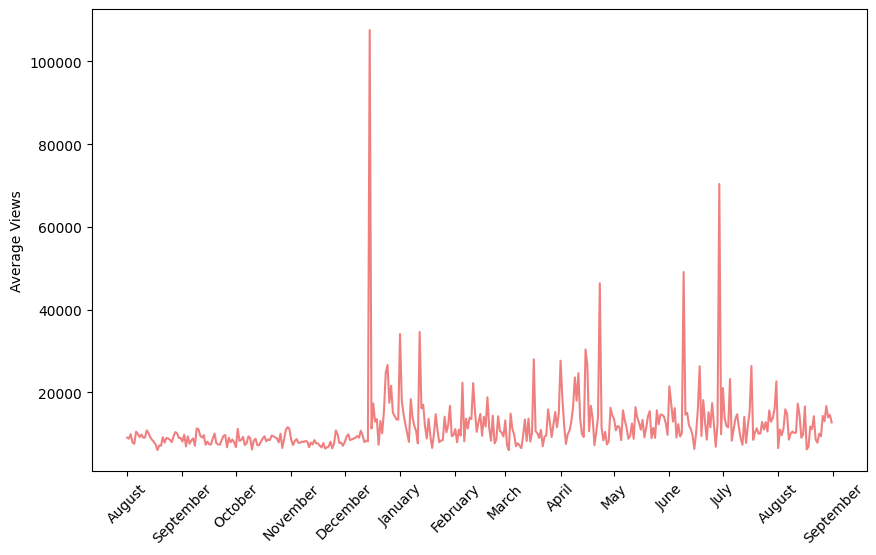

In [ ]:
#@title Time Series of Views


dt['created_at'] = pd.to_datetime(dt['created_at'], utc=True)
new_df = dt[['created_at', 'view_count']].set_index('created_at')
resampled_df = new_df.resample('D').mean().reset_index()
plt.figure(figsize=(10, 6))
plt.plot(resampled_df['created_at'], resampled_df['view_count'], color='lightcoral')
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%B'))
plt.ylabel('Average Views')
plt.grid(False)
plt.xticks(rotation=45)
plt.show()

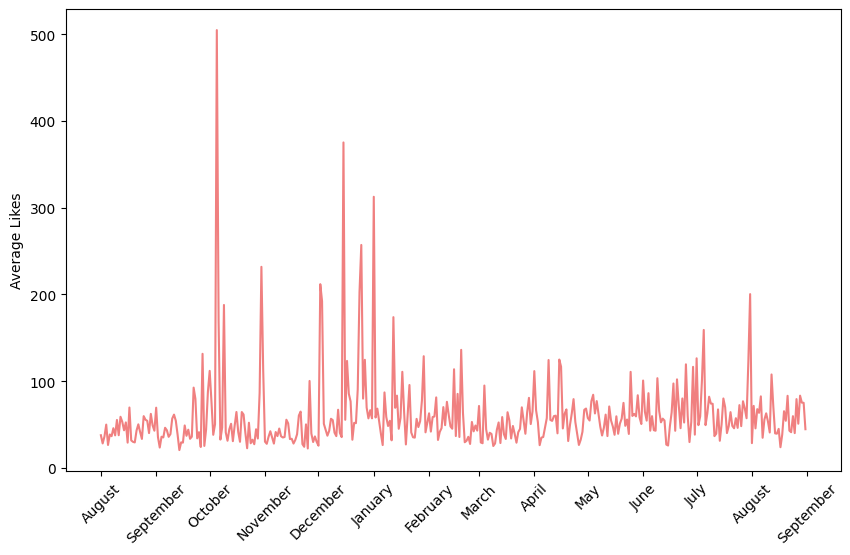

In [ ]:
#@title Time Series of Likes


dt['created_at'] = pd.to_datetime(dt['created_at'], utc=True)
new_df = dt[['created_at', 'favorite_count']].set_index('created_at')
resampled_df = new_df.resample('D').mean().reset_index()
plt.figure(figsize=(10, 6))
plt.plot(resampled_df['created_at'], resampled_df['favorite_count'], color='lightcoral')
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%B'))
plt.ylabel('Average Likes')
plt.grid(False)
plt.xticks(rotation=45)
plt.show()

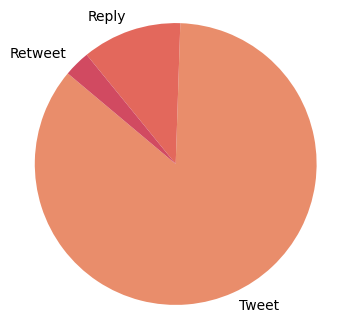

In [ ]:
#@title Type of Tweet


sns.set_palette("flare")
type_counts = dt['type'].value_counts()
plt.figure(figsize=(4, 4))
plt.pie(type_counts, labels=type_counts.index, startangle=140)
plt.axis('equal')
plt.show()

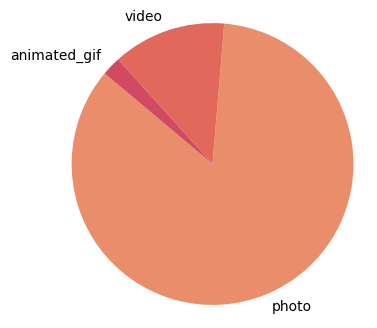

In [ ]:
#@title Type of Media


sns.set_palette("flare")
type_counts = dt['media_type'].value_counts()
plt.figure(figsize=(4, 4))
plt.pie(type_counts, labels=type_counts.index, startangle=140)
plt.axis('equal')
plt.show()

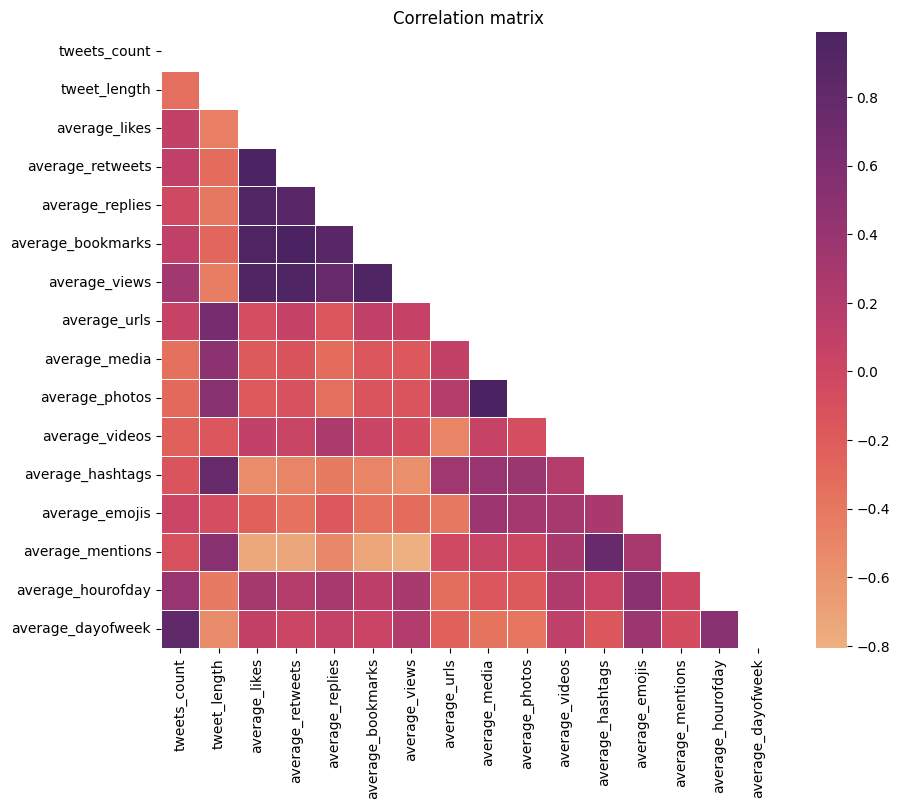

In [ ]:
#@title Correlation Matrix


merged_df_copy = merged_df.drop(columns=['id', 'sum_metrics'])
correlation_matrix = merged_df_copy.corr()
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='flare', square=True, cbar=True, mask=mask, linewidths=0.5, linecolor='white')
plt.title('Correlation matrix')
plt.show()



---



# **Part 3C**: Clustering Analysis <a name="part3c"></a>

- **Perform Standardization**: To put every variable in the same scale.
- **Perform PCA**: To reduce data dimensionality to 2 dimensions.
- **Perform Elbow Method**: To find the perfect number of clusters.
- **Perform K-Means**: To cluster the data.
- **Perform Sillhouette Coefficient**: To evaluate the clusters.
- **Analyse Clusters Statistics**: To find out what makes each cluster and what seperates them.

In [ ]:
#@title Standardize the Data


#standardize data using MinMax (it goes from 0 to 1)
scaled_df = merged_df.copy()
columns_to_scale = merged_df.columns[1:]
scaler = MinMaxScaler()
scaled_df[columns_to_scale] = scaler.fit_transform(merged_df[columns_to_scale])

print(scaled_df)

            id  tweets_count  tweet_length  average_likes  average_retweets  \
0         duke      0.289770      0.349297       0.109725          0.101987   
1         epfl      0.237815      0.700557       0.050601          0.089798   
2          goe      0.000000      1.000000       0.021326          0.102093   
3      harvard      1.000000      0.130769       0.767864          0.832893   
4    leicester      0.581146      0.764948       0.000000          0.000000   
5   manchester      0.662025      0.188990       0.005599          0.033335   
6          mit      0.479914      0.579524       0.541971          0.747891   
7           sb      0.302089      0.417714       0.032198          0.042596   
8     stanford      0.107124      0.304168       1.000000          1.000000   
9      trinity      0.435458      0.729347       0.089952          0.170710   
10          wv      0.395287      0.000000       0.298748          0.162743   
11        yale      0.832351      0.630151       0.0

In [ ]:
#@title PCA


#we only want the numerical variables
numeric_cols = scaled_df.select_dtypes(include=['float64', 'int64']).columns
numeric_df = scaled_df[numeric_cols]

#apply PCA to reduce the data dimensionality
pca = PCA(n_components=2)
principal_components = pca.fit_transform(numeric_df)
pc_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

print(pc_df)

         PC1       PC2
0   0.032165 -0.177712
1  -0.389665 -0.198677
2  -1.031586  0.885741
3   1.596341 -0.130553
4  -1.165655  0.130056
5   0.081699 -1.054362
6   0.693493  1.159845
7  -0.424609 -0.397619
8   1.528705  0.314903
9  -0.881793  0.207246
10  0.137048 -0.363369
11 -0.176144 -0.375500


In [ ]:
#@title PCA 3 Components


#apply PCA to reduce the data dimensionality
pca_5 = PCA(n_components= 5)
principal_components_5 = pca_5.fit_transform(numeric_df)
pc_df_5 = pd.DataFrame(data=principal_components_5, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])

print(pc_df_5)

         PC1       PC2       PC3       PC4       PC5
0   0.032165 -0.177712 -0.606364 -0.486295 -0.046664
1  -0.389665 -0.198677 -0.499665  0.069087  0.223995
2  -1.031586  0.885741 -0.538940 -0.194216  0.113702
3   1.596341 -0.130553 -0.060804  0.662637 -0.359985
4  -1.165655  0.130056  0.827815  0.429699 -0.297655
5   0.081699 -1.054362 -0.124406 -0.389738 -0.020804
6   0.693493  1.159845 -0.102421 -0.231434 -0.501417
7  -0.424609 -0.397619  0.074413  0.057619  0.226748
8   1.528705  0.314903  0.420981 -0.086663  0.845012
9  -0.881793  0.207246  0.445493  0.187241  0.425248
10  0.137048 -0.363369  0.708137 -0.649656 -0.461180
11 -0.176144 -0.375500 -0.544238  0.631719 -0.147000


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

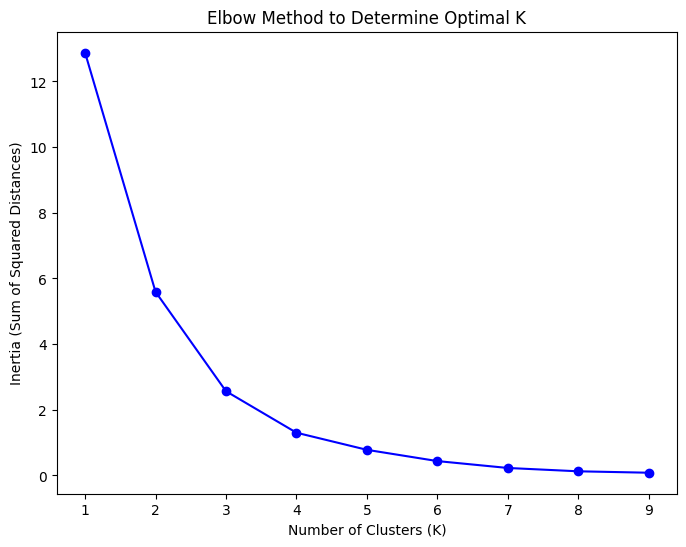

In [ ]:
#@title Elbow Method


#we only want the numerical variables
numeric_cols = pc_df.select_dtypes(include=['float64', 'int64']).columns
numeric_df = pc_df[numeric_cols]

#calculate the inertia
inertia = []
k_range = range(1, 10)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(numeric_df)
    inertia.append(kmeans.inertia_)

#plot the elbow method, in order to determine the ideal number of clusters
plt.figure(figsize=(8, 6))
plt.plot(k_range, inertia, 'bo-')
plt.title("Elbow Method to Determine Optimal K")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia (Sum of Squared Distances)")
plt.show()

#the elbow in the graph is around 4, so 4 is the ideal number of clusters

In [ ]:
#@title K-Means Clustering 3 Components


#calculate the clusters using K-Means
optimal_k = 4
pc_df_5['id'] = merged_df['id']
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
pc_df_5['cluster'] = kmeans.fit_predict(pc_df_5[['PC1', 'PC2', 'PC3']])


#define data for the scatter plot
scatter_data = go.Scatter3d(
    x=pc_df_5['PC1'],
    y=pc_df_5['PC2'],
    z=pc_df_5['PC3'],
    mode='markers+text',
    text=pc_df_5['id'],
    marker=dict(
        size=10,
        color=pc_df_5['cluster'],
        colorscale='Viridis',
        opacity=0.8
    )
)

#define layout for the plot
layout = go.Layout(
    title='K-means Clustering 3PCs',
    scene=dict(
        xaxis=dict(title='PC1'),
        yaxis=dict(title='PC2'),
        zaxis=dict(title='PC3')
    ),
    width=1000,
    height=600
)

fig = go.Figure(data=[scatter_data], layout=layout)
fig.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



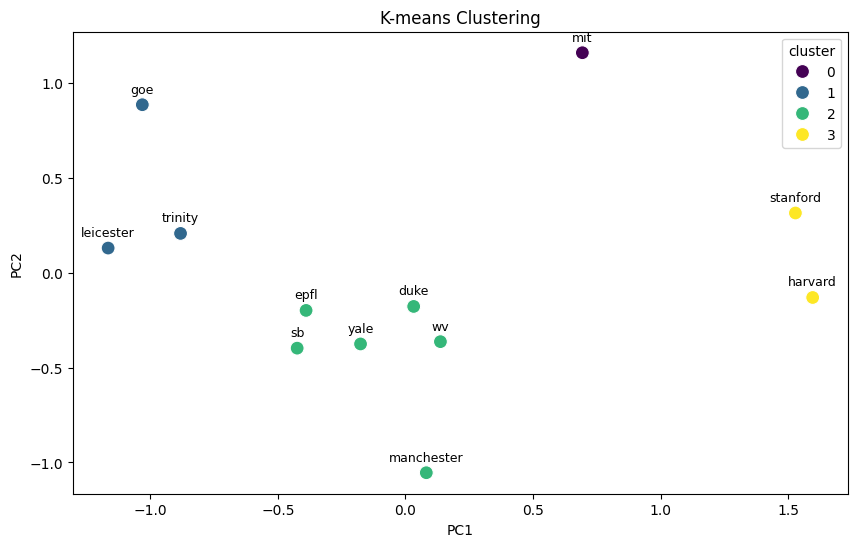

In [ ]:
#@title K-Means Clustering 2 Components


#calculate the clusters using K-Means
optimal_k = 4
pc_df['id'] = merged_df['id']
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
pc_df['cluster'] = kmeans.fit_predict(pc_df[['PC1', 'PC2']])

#plot the results with the labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='cluster', data=pc_df, palette='viridis', s=100)
for _, row in pc_df.iterrows():
    plt.text(row['PC1'], row['PC2']+0.08, row['id'], fontsize=9, ha='center', va='center', color='black')
plt.title("K-means Clustering")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

In [ ]:
#@title Sillhouette Coefficient


#in order the evaluate how good our clustering is, we're going to calculate the sillhouette coefficient
silhouette_avg = silhouette_score(pc_df[['PC1', 'PC2']], pc_df['cluster'])
print("Silhouette Coefficient:", silhouette_avg)

Silhouette Coefficient: 0.5420040972130159


In [ ]:
#@title K-Means Clustering Statistcs


#analyze characteristics of each cluster
cluster_analysis = merged_df.copy()
cluster_analysis['cluster'] = pc_df['cluster']

#group by 'cluster' and calculate descriptive statistics
cluster_descriptive_stats = cluster_analysis.groupby('cluster').agg({
    'id': 'count',
    'tweets_count': 'mean',
    'tweet_length': 'mean',
    'average_likes': 'mean',
    'average_retweets': 'mean',
    'average_replies': 'mean',
    'average_bookmarks': 'mean',
    'average_views': 'mean',
    'average_urls': 'mean',
    'average_media': 'mean',
    'average_photos': 'mean',
    'average_videos': 'mean',
    'average_hashtags': 'mean',
    'average_emojis': 'mean',
    'average_mentions': 'mean',
    'average_hourofday': 'mean',
    'average_dayofweek': 'mean'
})

#add ranking columns for each attribute
for col in cluster_descriptive_stats.columns:
    cluster_descriptive_stats[f'{col}_rank'] = cluster_descriptive_stats[col].rank(ascending=False, method='min')
rank_columns = [col for col in cluster_descriptive_stats.columns if col.endswith('_rank')]
rank_df = cluster_descriptive_stats[rank_columns]

print()
print(rank_df)


         id_rank  tweets_count_rank  tweet_length_rank  average_likes_rank  \
cluster                                                                      
0            4.0                2.0                2.0                 2.0   
1            2.0                4.0                1.0                 4.0   
2            1.0                3.0                3.0                 3.0   
3            3.0                1.0                4.0                 1.0   

         average_retweets_rank  average_replies_rank  average_bookmarks_rank  \
cluster                                                                        
0                          2.0                   2.0                     2.0   
1                          4.0                   4.0                     4.0   
2                          3.0                   3.0                     3.0   
3                          1.0                   1.0                     1.0   

         average_views_rank  average_urls_rank  a

# Conclusion of the K-Means Clustering Analysis

**Cluster 0: MIT.**
- Uses a lot of media mainly photos, but very little videos.
- Uses very little hashtags and emojis.
- Uses a lot of URLs.
-Mentions the least other accounts.
- Tweets latter in the day, in comparasion with the others.

**Cluster 1: GOE, TRINITY, LEICESTER.**
- Tweets the less.
- The tweets are the biggest.
- Have the less views, likes, retweets, replies and bookmarks.
- Uses a lot of hashtags and emojis.
- Mentions the most other accounts.
- Tweets latter in the week, in comparasion with the others.

**Cluster 2: EPFL, DUKE, SB, YALE, WV, MANCHESTER.**
- The tweets have very little URLs.

**Cluster 3: STANDFORD, HAVARD.**
- Tweets the most.
- The tweets are the smallest.
- Have the most views, likes, retweets, replies and bookmarks.
- Use very little media, although they are the ones that use the most videos, using very little photos.
- Mentions the most other accounts.
- Tweets sooner in the day and week, in comparasion with the others.





---



#  **Part 4:** Content Analysis <a name="part4"></a>

# **Part 4A**: Pre-Processing <a name="part4a"></a>

- **Data Pre-Processing**: To clean the text, remove stop words and lemmatize.

In [ ]:
#@title Pre-Processing


def clean_text(text):
    #lower case every word
    text = text.lower()

    #remove the hashtags
    text = re.sub(r'#\w+', '', text)

    #remove the urls
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

    #remove the emojis
    text = emoji.replace_emoji(text, '')

    #remove the mentions
    text = re.sub(r'@\w+', '', text)

    #remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))

    #remove quotes
    text = text.replace("'", "")
    text = text.replace('"', "")
    text = text.replace('’', "")

    #remove hyphens
    text = text.replace("—", "")

    #remove stop words (useless words)
    words = nltk.word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word.lower() not in stop_words]

    #lemmatization (transform words to their root form)
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    text = ' '.join(words)

    #trim extra spaces
    text = re.sub(r'\s+', ' ', text).strip()

    return text

dt['text'] = dt['text'].apply(clean_text)

for line in dt['text'].head(10):
    print(line)
    print()

yale study career path 20000 u medical student found female lowincome belong underrepresented ethnic group le likely enter surgical residency

birdseye view kline tower tallest building campus

peter salovey announced today academic year last yale 23rd president return faculty full time 11 transformative year head university watch video read yale news

phd student yale nerea cal deepening understanding international affair also climbing military ladder week promoted lieutenant colonel ceremony beinecke plaza read story

smile today happy first day class bulldog

close gender wage gap need address society differing expectation around bear burden family parenting responsibility say yale school management mushfiq mobarak

virus mutate matter time yet another new strain covid19 emerged started spread expert explains whether eg5 transmissible severe previous omicron subvariants

yale researcher found two brain abnormality arise early development associated autism spectrum disorder brain siz



---



# **Part 4B**: Top TF-IDF Words <a name="part4b"></a>

- **Identify Important Words**: Using TF-IDF.
- **Wordcloud for the Top Words of Each Sentiment**: To visualize the most

In [ ]:
#@title Important Words Based on TF-IDF


#apply TF-IDF Vectorizer
vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(dt['text'])
feature_names = vectorizer.get_feature_names_out()

#find the top terms based on TF-IDF
def get_top_terms(matrix, feature_names, top_n=5):
    sorted_indices = matrix.mean(axis=0).argsort()[0, ::-1]
    top_terms = [feature_names[i] for i in sorted_indices[:top_n]]
    return top_terms

top_terms = get_top_terms(tfidf_matrix, feature_names)

#flatten the top words list
top_terms_flattened = [item for sublist in top_terms for item in sublist.flatten()]
top_terms = np.array(top_terms).flatten().tolist()
top_terms = top_terms[:200]

print("Top Terms:")
print(top_terms)

Top Terms:
['new', 'student', 'yale', 'research', 'university', 'campus', 'year', 'read', 'researcher', 'day', 'study', 'today', 'congratulation', 'week', 'health', 'harvard', 'professor', 'help', 'work', 'time', 'community', 'school', 'amp', 'learn', 'science', 'event', 'people', 'welcome', 'leicester', 'change', 'team', 'support', 'duke', 'scientist', 'world', 'mit', 'climate', 'news', '2023', 'make', 'discus', 'life', 'manchester', 'faculty', 'project', 'expert', 'member', 'class', 'happy', 'open', 'way', 'woman', 'college', 'join', 'graduate', 'information', 'know', 'say', 'program', 'offer', 'award', 'mountaineer', 'summer', 'book', 'staff', 'future', 'disease', 'let', 'hi', '2022', 'impact', 'history', 'share', 'trinity', 'art', 'patient', 'need', 'explore', 'space', 'human', 'story', 'president', 'meet', 'like', 'cancer', 'look', 'experience', 'place', 'great', 'service', 'social', 'good', 'black', 'course', 'brain', 'working', 'dr', 'family', 'public', 'technology', 'visit', 't

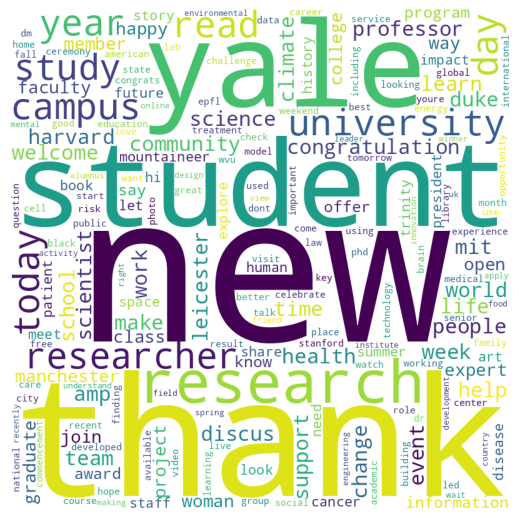

In [ ]:
#@title Wordcloud for the Top Words


top_terms_text = ' '.join(top_terms)
wordcloud = WordCloud(width=800, height=800,
                background_color='white',
                stopwords=None,
                min_font_size=10).generate(top_terms_text)
plt.figure(figsize =(10, 5), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()



---



# **Part 4C**: Sentiment Analysis <a name="part4c"></a>

- **Sentiment Analysis**.
- **Wordcloud for the Top Words of Each Sentiment**: To visualize the most important words for each sentiment.
- **Barplot With the Average Views per Sentiment**: To visualize wich sentiment gets the most views.
- **Barplot With the Average Likes per Sentiment**: To visualize wich sentiment gets the most likes.

In [ ]:
#@title Sentiment Analysis


#extract sentiment value
sia = SentimentIntensityAnalyzer()
def get_sentiment_value(text):
    sentiment = sia.polarity_scores(text)['compound']
    return sentiment

dt['sentiment_value'] = dt['text'].apply(get_sentiment_value)

#extract sentiment
def get_sentiment(text):
    sentiment = sia.polarity_scores(text)['compound']
    if sentiment < 0:
      return 'negative'
    elif sentiment > 0:
      return 'positive'
    else:
      return 'neutral'

dt['sentiment'] = dt['text'].apply(get_sentiment)


print(dt[['text', 'sentiment_value', 'sentiment']])

                                                    text  sentiment_value  \
0      yale study career path 20000 u medical student...           0.0000   
1      birdseye view kline tower tallest building campus           0.0000   
2      peter salovey announced today academic year la...           0.0000   
3      phd student yale nerea cal deepening understan...           0.4215   
4              smile today happy first day class bulldog           0.7351   
...                                                  ...              ...   
11722  streaming service pay artist researcher tackle...           0.2732   
11723              sure follow social medium see content           0.3182   
11724  join weeklong celebration conservation breedin...           0.7096   
11725  summer student antoinette charles selected joi...           0.6808   
11726  summer hosted neuroscience program rising juni...           0.3612   

      sentiment  
0       neutral  
1       neutral  
2       neutral  
3  

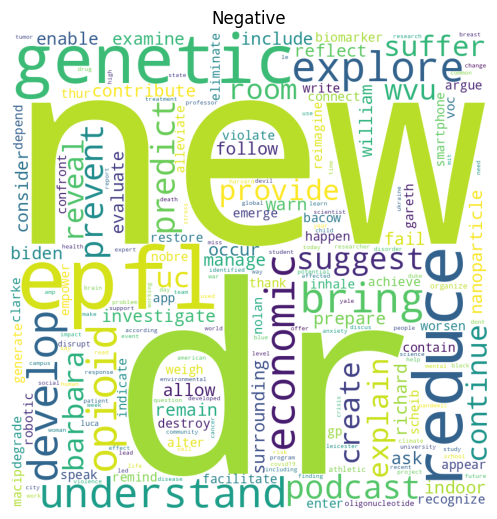

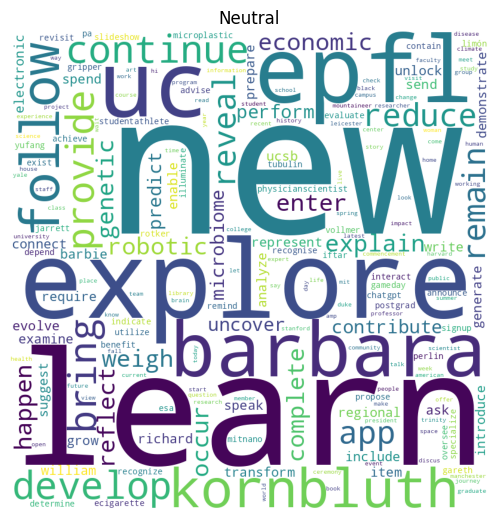

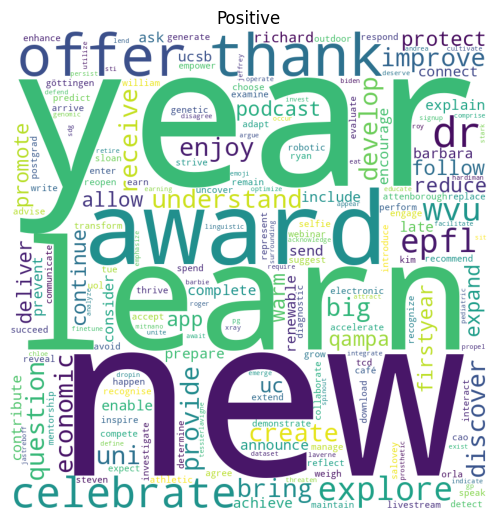

In [ ]:
#@title Wordcloud for the Top Words of Each Sentiment


#top TD-IDF words for each sentiment
grouped_by_sentiment = dt.groupby('sentiment')
top_terms_by_sentiment = {}
for sentiment, group in grouped_by_sentiment:
    vectorizer = TfidfVectorizer(stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(group['text'])
    feature_names = vectorizer.get_feature_names_out()
    sorted_indices = tfidf_matrix.mean(axis=0).argsort()[0, ::-1]
    top_terms = [feature_names[i] for i in sorted_indices[:200]]
    top_terms_flattened = [item for sublist in top_terms for item in sublist.flatten()]
    top_terms_by_sentiment[sentiment] = np.array(top_terms).flatten().tolist()

#generate wordcloud for each sentiment
for sentiment, top_terms in top_terms_by_sentiment.items():
    top_terms_text = ' '.join(top_terms)
    wordcloud = WordCloud(width=800, height=800, background_color='white', min_font_size=10).generate(top_terms_text)
    plt.figure(figsize=(10, 5), facecolor=None)
    plt.imshow(wordcloud)
    plt.title(sentiment.capitalize())
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

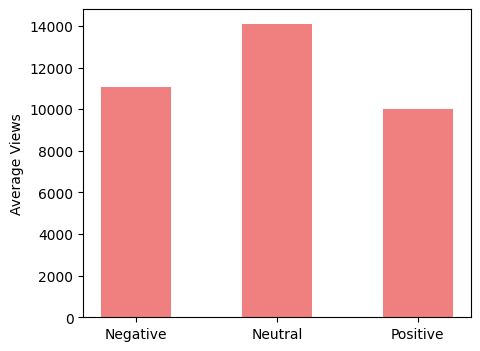

In [ ]:
#@title Average Views per Sentiment


grouped_by_sentiment = dt.groupby('sentiment')
fig, ax = plt.subplots(figsize=(5, 4))

for sentiment, group_data in grouped_by_sentiment:
    average_views = group_data['view_count'].mean()
    ax.bar(sentiment.capitalize(), average_views, color='lightcoral', width=0.5)

ax.set_ylabel('Average Views')
plt.show()

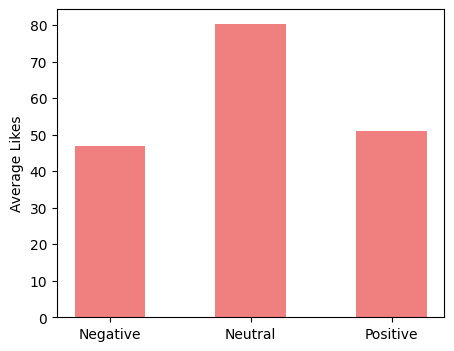

In [ ]:
#@title Average Likes per Sentiment


grouped_by_sentiment = dt.groupby('sentiment')
fig, ax = plt.subplots(figsize=(5, 4))

for sentiment, group_data in grouped_by_sentiment:
    average_views = group_data['favorite_count'].mean()
    ax.bar(sentiment.capitalize(), average_views, color='lightcoral', width=0.5)

ax.set_ylabel('Average Likes')
plt.show()



---



# **Part 4D**: Emotion Recognition <a name="part4d"></a>

- **Emotion Recognition Estimation**: pre-trained transformer-based model the RoBERTa.
- **Emotion Recognition Analysis**: aggregation of metrics by emotions.
- **Bubble Chart of top 10 Emotions**: comparing views, likes and volume.
- **Wordcloud for the Top Words of Each Emotion**: To visualize the most important words for each emotion.

In [ ]:
#@title Emotion Recognition


##### RUNTIME WARNING (+1h30min) #####


#load pre-trained emotion detection model
emotion_classifier = pipeline('sentiment-analysis', model='arpanghoshal/EmoRoBERTa')

#estimate emotions for the cleaned text
dt['emotion'] = dt['text'].apply(lambda x: emotion_classifier(x)[0]['label'])

#display the first few rows with predicted emotions
dt[['text', 'emotion']].head()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning:


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.



config.json:   0%|          | 0.00/1.72k [00:00<?, ?B/s]

tf_model.h5:   0%|          | 0.00/501M [00:00<?, ?B/s]

All model checkpoint layers were used when initializing TFRobertaForSequenceClassification.

All the layers of TFRobertaForSequenceClassification were initialized from the model checkpoint at arpanghoshal/EmoRoBERTa.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFRobertaForSequenceClassification for predictions without further training.


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

In [ ]:
#@title Emotion Analysis


#read csv with the information stored after running the emotion estimation
dt['emotion'] = pd.read_csv('/content/drive/MyDrive/TACD/dt_emo.csv')


#group by emotion and calculate the count of each emotion
emotion_counts = dt['emotion'].value_counts().reset_index()
emotion_counts.columns = ['emotion', 'count']

#select the top 10 emotions by count
top_10_emotions = emotion_counts.head(10)

#filter the original dataframe to include only the top 10 emotions
filtered_dt = dt[dt['emotion'].isin(top_10_emotions['emotion'])]

#group by emotion and calculate average sentiment intensity, view count, and favorite count
average_metrics_by_emotion = filtered_dt.groupby('emotion').agg(
    average_sentiment_value=('sentiment_value', 'mean'),
    average_view=('view_count', 'mean'),
    average_favorite_count=('favorite_count', 'mean'),
    average_bookmark=('bookmark_count', 'mean')

).reset_index()

#merge with the emotion counts
average_metrics_by_emotion = pd.merge(emotion_counts,average_metrics_by_emotion, on='emotion')

#sort by emotion counts
average_metrics_by_emotion = average_metrics_by_emotion.sort_values(by='count', ascending=False)

#convert data types and format floats to two decimal places
average_metrics_by_emotion = average_metrics_by_emotion.astype({
    'count': 'int',
    'average_sentiment_value': 'float',
    'average_view': 'int',
    'average_favorite_count': 'int',
    'average_bookmark': 'float'
})

average_metrics_by_emotion['average_sentiment_value'] = average_metrics_by_emotion['average_sentiment_value'].round(2)
average_metrics_by_emotion['average_bookmark'] = average_metrics_by_emotion['average_bookmark'].round(2)

#display the result
print(average_metrics_by_emotion)

       emotion  count  average_sentiment_value  average_view  \
0      neutral   8531                     0.22         11529   
1   admiration    568                     0.66          8583   
2    gratitude    489                     0.64          5596   
3     approval    404                     0.39         17513   
4   excitement    394                     0.58          9387   
5          joy    346                     0.67         10421   
6       caring    161                     0.45          9036   
7     optimism    146                     0.62          8145   
8         fear    113                    -0.05         11440   
9  realization    105                     0.05         10916   

   average_favorite_count  average_bookmark  
0                      55              1.63  
1                      57              1.06  
2                      46              0.38  
3                      68              1.47  
4                      66              0.71  
5                  

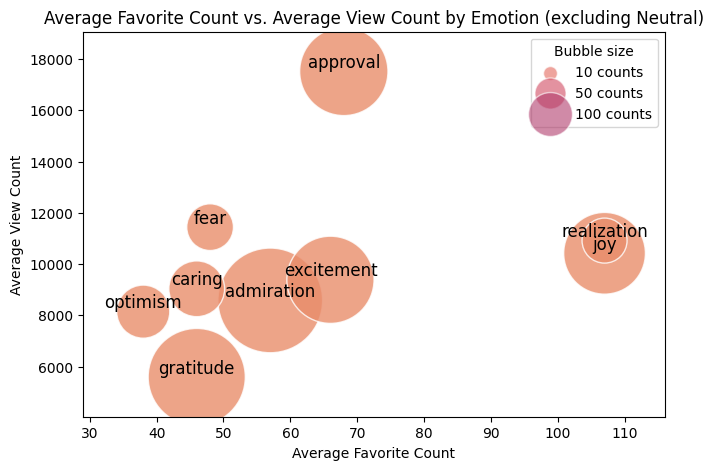

In [ ]:
#@title Emotion Bubble Chart


#exclude the emotion 'neutral'
filtered_metrics = average_metrics_by_emotion[average_metrics_by_emotion['emotion'] != 'neutral']

#create the scatter plot
plt.figure(figsize=(7.5, 5))
scatter = plt.scatter(
    filtered_metrics['average_favorite_count'],
    filtered_metrics['average_view'],
    s=filtered_metrics['count']*10,
    alpha=0.8,
    edgecolors='w'
)

#annotate the points with the emotion names, slightly above the points to avoid overlap
for i, txt in enumerate(filtered_metrics['emotion']):
    plt.annotate(
        txt,
        (filtered_metrics['average_favorite_count'].iloc[i], filtered_metrics['average_view'].iloc[i]),
        fontsize=12,
        ha='center',
        va='bottom'
    )

#adjust the axis limits to ensure all circles are fully visible
padding = 0.13
x_range = np.ptp(filtered_metrics['average_favorite_count'])
y_range = np.ptp(filtered_metrics['average_view'])

plt.xlim(filtered_metrics['average_favorite_count'].min() - padding * x_range,
         filtered_metrics['average_favorite_count'].max() + padding * x_range)
plt.ylim(filtered_metrics['average_view'].min() - padding * y_range,
         filtered_metrics['average_view'].max() + padding * y_range)

#add a legend for bubble sizes
sizes = [10, 50, 100]
labels = ['10 counts', '50 counts', '100 counts']
handles = [plt.scatter([], [], s=size * 10, alpha=0.6, edgecolors='w') for size in sizes]
plt.legend(handles, labels, title='Bubble size', loc='upper right')

plt.xlabel('Average Favorite Count')
plt.ylabel('Average View Count')
plt.grid(False)
plt.title('Average Favorite Count vs. Average View Count by Emotion (excluding Neutral)')
plt.show()

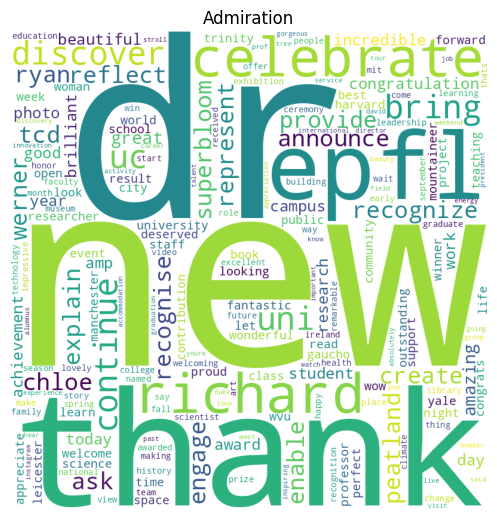

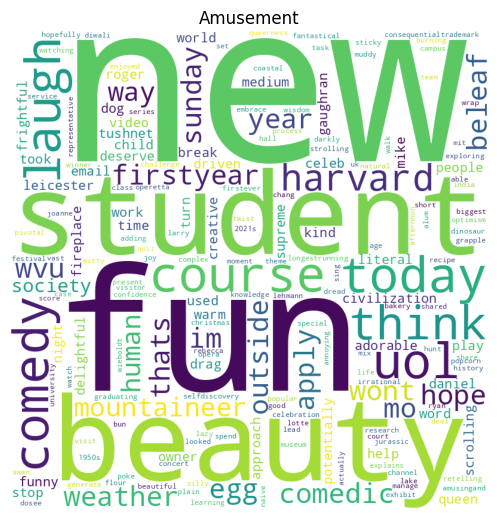

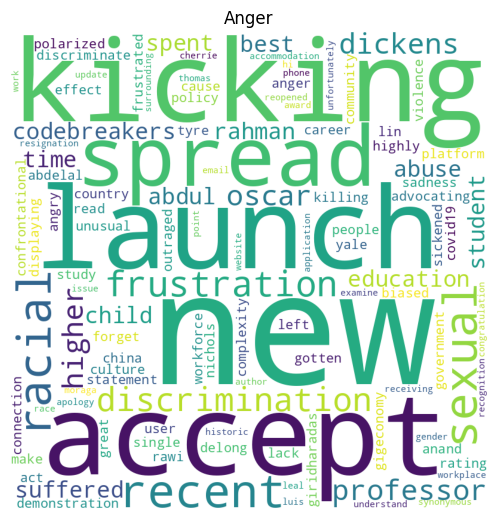

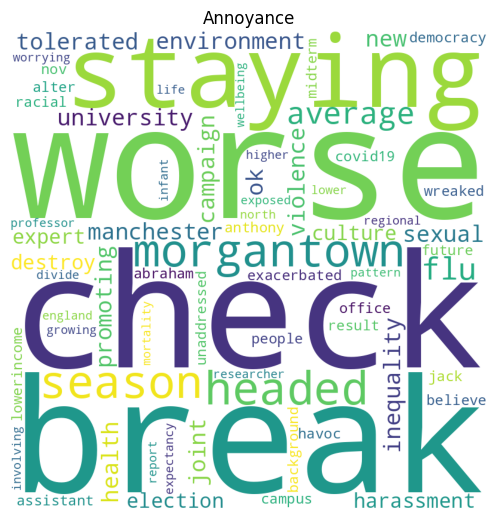

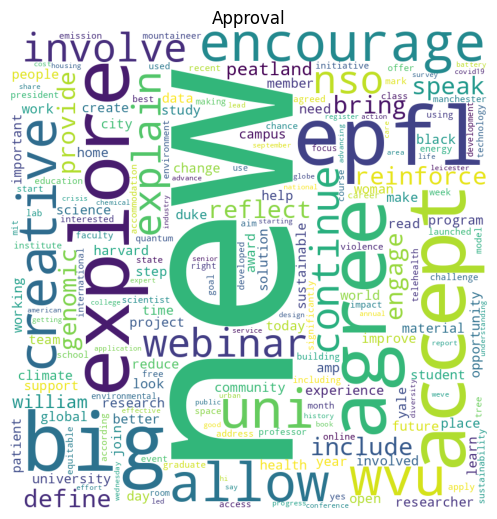

...

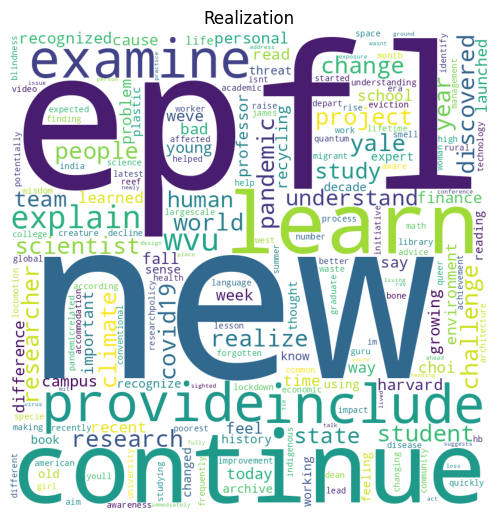

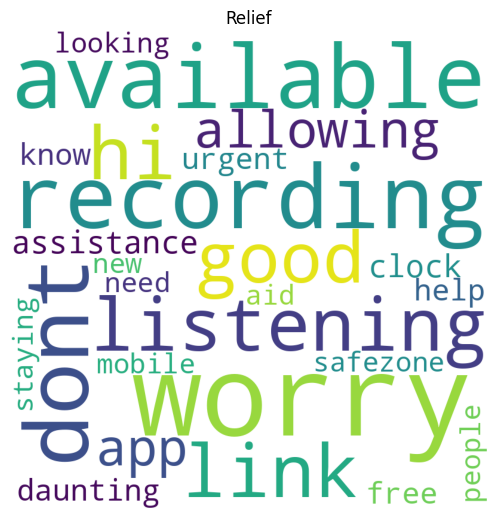

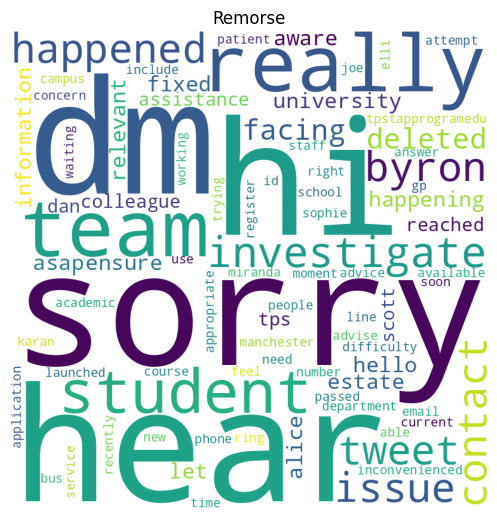

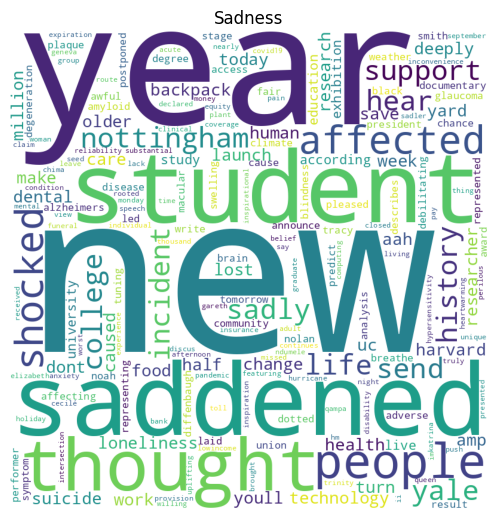

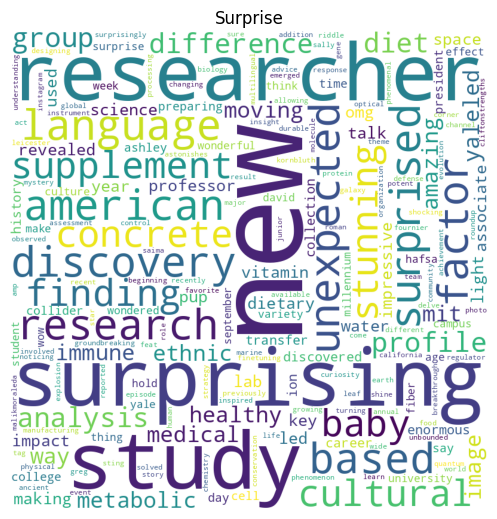

In [ ]:
#@title Wordcloud for the Top Words of Each Emotion


#top TD-IDF words for each emotion
grouped_by_emotion = dt.groupby('emotion')
top_terms_by_emotion = {}
for emotion, group in grouped_by_emotion:
    vectorizer = TfidfVectorizer(stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(group['text'])
    feature_names = vectorizer.get_feature_names_out()
    sorted_indices = tfidf_matrix.mean(axis=0).argsort()[0, ::-1]
    top_terms = [feature_names[i] for i in sorted_indices[:200]]
    top_terms_flattened = [item for sublist in top_terms for item in sublist.flatten()]
    top_terms_by_emotion[emotion] = np.array(top_terms).flatten().tolist()

#generate wordcloud for each emotion
for emotion, top_terms in top_terms_by_emotion.items():
    top_terms_text = ' '.join(top_terms)
    wordcloud = WordCloud(width=800, height=800, background_color='white', min_font_size=10).generate(top_terms_text)
    plt.figure(figsize=(10, 5), facecolor=None)
    plt.imshow(wordcloud)
    plt.title(emotion.capitalize())
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()



---



# **Part 4E**:  Category Identification <a name="part4e"></a>

#**Part 4E1**: Approach 1 <a name="approach1">

- **Build Important Words Tuple per Tweet**: To count the occurrence of each word per tweet.
- **Transform the Tuples Into a Dataframe**: To apply our methods.
- **Perform PCA**: To reduce data dimensionality to 2 dimensions.
- **Perform K-Means**: To cluster the data.
- **Perform Sillhouette Coefficient**: To evaluate the clusters.
- **Analyse Clusters Statistics**: To find out what makes each cluster and what seperates them.
- **Assign Each Cluster to a Category**: Manually.

In [ ]:
#@title Important Words Tuples


#count top terms for each text and organize it in a tuple
def count_word_occurrences(text, top_terms):
    words = text.lower().split()
    word_counts = tuple(words.count(word) for word in top_terms)
    return word_counts

dt_a1 = dt.copy()
dt_a1['tuple'] = dt_a1['text'].apply(lambda text: count_word_occurrences(text, top_terms))

print("Tuples:")
print(dt_a1[['text', 'tuple']])

Tuples:
                                                    text  \
0      yale study career path 20000 u medical student...   
1      birdseye view kline tower tallest building campus   
2      peter salovey announced today academic year la...   
3      phd student yale nerea cal deepening understan...   
4              smile today happy first day class bulldog   
...                                                  ...   
11722  streaming service pay artist researcher tackle...   
11723              sure follow social medium see content   
11724  join weeklong celebration conservation breedin...   
11725  summer student antoinette charles selected joi...   
11726  summer hosted neuroscience program rising juni...   

                                                   tuple  
0      (0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
1      (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
2      (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
3      (0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
#@title Dataframe with Tuples


#create a new tuples dataframe
tuple_df = pd.DataFrame(dt_a1['tuple'].tolist(), columns=top_terms)
tuple_df['text'] = dt_a1['text']
tuple_df = tuple_df[['text']+top_terms]

print("Tuple DataFrame:")
print(tuple_df)

Tuple DataFrame:
                                                    text  surprising  new  \
0      yale study career path 20000 u medical student...           0    0   
1      birdseye view kline tower tallest building campus           0    0   
2      peter salovey announced today academic year la...           0    0   
3      phd student yale nerea cal deepening understan...           0    0   
4              smile today happy first day class bulldog           0    0   
...                                                  ...         ...  ...   
11721  little rain ‘ going stop new orleansstyle cele...           0    0   
11722  streaming service pay artist researcher tackle...           0    0   
11723              sure follow social medium see content           0    1   
11724  join weeklong celebration conservation breedin...           0    0   
11725  summer student antoinette charles selected joi...           0    0   

       study  researcher  discovery  surprised  research  

In [ ]:
#@title PCA


#we only want the numerical variables
numeric_cols = tuple_df.select_dtypes(include=['float64', 'int64']).columns
numeric_df = tuple_df[numeric_cols]

#apply PCA to reduce the data dimensionality
pca = PCA(n_components=2)
principal_components = pca.fit_transform(numeric_df)
pc_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

print(pc_df)

            PC1       PC2
0      0.118888  0.860593
1     -0.242177 -0.097670
2      0.300938  0.233373
3     -0.094713  0.883430
4     -0.302744 -0.151759
...         ...       ...
11721 -0.099160 -0.293205
11722 -0.203439 -0.190440
11723  0.679042 -0.013884
11724 -0.238914  0.737142
11725 -0.076654  0.005357

[11726 rows x 2 columns]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



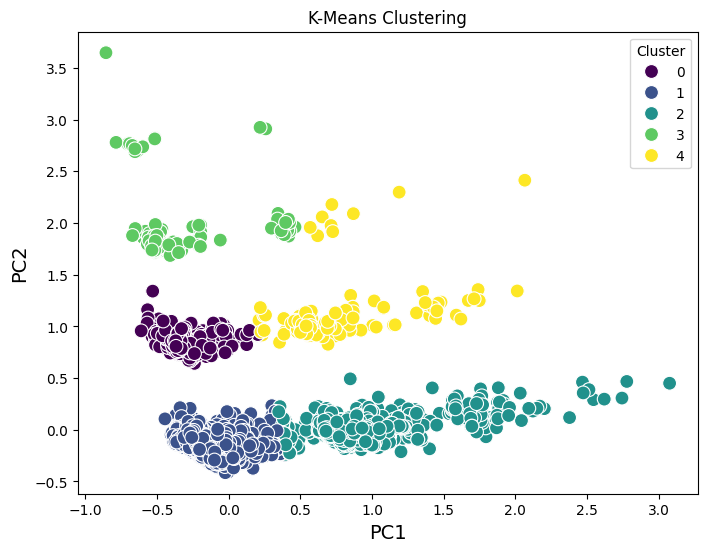

In [ ]:
#@title K-Means Clustering


#calculate the clusters using K-Means
optimal_k = 5
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(pc_df)
pc_df['Cluster'] = cluster_labels

#plot the results
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pc_df, palette='viridis', s=100)
plt.title("K-Means Clustering")
plt.xlabel("PC1", fontsize=14)
plt.ylabel("PC2", fontsize=14)
#plt.savefig('kmeans.png')
plt.show()

In [ ]:
#@title Sillhouette Coefficient


#in order the evaluate how good our clustering is, we're going to calculate the sillhouette coefficient
silhouette_avg = silhouette_score(pc_df[['PC1', 'PC2']], pc_df['Cluster'])
print("Sillhouette Coefficient:", silhouette_avg)

Sillhouette Coefficient: 0.8192536930499361


In [ ]:
#@title Merge Dataframes


#adding index
pc_df['new_id'] = pc_df.index+1
tuple_df['new_id'] = tuple_df.index+1
dt['new_id'] = dt.index+1

#merge dataframes
tuple_df.drop(columns=['text'], inplace=True)
merged_df = pd.DataFrame()
merged_df = pc_df.merge(dt[['new_id', 'sentiment', 'emotion']], on='new_id', how='left') \
                 .merge(tuple_df, on='new_id', how='left')

merged_df

,PC1,PC2,Cluster,new_id,sentiment,emotion,surprising,new,study,researcher,...,simply,choose,doesnt,consume,duke,matter,personalize,given,necessary,aim
0,0.118888,0.860593,0,1,neutral,neutral,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,-0.242177,-0.097670,1,2,neutral,neutral,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0.300938,0.233373,1,3,neutral,neutral,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-0.094713,0.883430,0,4,positive,neutral,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,-0.302744,-0.151759,1,5,positive,joy,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11721,-0.099160,-0.293205,1,11722,negative,neutral,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
11722,-0.203439,-0.190440,1,11723,positive,neutral,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11723,0.679042,-0.013884,2,11724,positive,neutral,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
11724,-0.238914,0.737142,0,11725,positive,neutral,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#@title K-Means Clustering Statistics


#get statistics for each cluster
cluster_group = merged_df.groupby('Cluster')
first_sentiment = cluster_group['sentiment'].agg(lambda x: x.mode()[0])
first_emotion = cluster_group['emotion'].agg(lambda x: x.mode()[0])
second_sentiment = cluster_group['sentiment'].apply(lambda x: x.value_counts().index[1] if len(x.value_counts()) > 1 else None)
second_emotion = cluster_group['emotion'].apply(lambda x: x.value_counts().index[1] if len(x.value_counts()) > 1 else None)

#get the top words per cluster
word_columns = [col for col in merged_df.columns if col not in ['PC1', 'PC2', 'Cluster', 'id', 'sentiment', 'emotion']]

def top_10_words(cluster):
    return cluster.sort_values(ascending=False).head(10).index.tolist()

top_10_words = cluster_group[word_columns].sum().apply(top_10_words, axis=1)

def top_20_words(cluster):
    return cluster.sort_values(ascending=False).head(20).index.tolist()

top_20_words = cluster_group[word_columns].sum().apply(top_20_words, axis=1)
top_11to20_words = top_20_words.apply(lambda words: words[10:20])

def top_30_words(cluster):
    return cluster.sort_values(ascending=False).head(30).index.tolist()

top_30_words = cluster_group[word_columns].sum().apply(top_30_words, axis=1)
top_21to30_words = top_30_words.apply(lambda words: words[21:30])

#create a new dataFrame with the statistics
cluster_stats = pd.DataFrame()
cluster_stats = pd.DataFrame({
    '1st-Sentiment': first_sentiment.values,
    '2nd-Sentiment': second_sentiment.values,
    '1st-Emotion': first_emotion.values,
    '2nd-Emotion': second_emotion.values,
    'Top10-Words': top_10_words.values,
    'Top11to20-Words': top_11to20_words.values,
    'Top21to30-Words': top_21to30_words.values
})

#print
print(cluster_stats.iloc[:, :-3])
print()

print("Top10-Words")
top_10_words = cluster_stats['Top10-Words']
for index, words in enumerate(top_10_words):
    print(f"{words}")
print()

print("Top11to20-Words")
for index, words in enumerate(top_11to20_words):
    print(f"{words}")
print()

print("Top21to30-Words")
for index, words in enumerate(top_21to30_words):
    print(f"{words}")
print()


text_df = dt[['new_id', 'text', 'media_type']]
new_df = pd.merge(merged_df, text_df, on='new_id', how='left')
cluster_0_df = new_df[new_df['Cluster'] == 0]
text_cluster_0_df = cluster_0_df[['text']]
cluster_1_df = new_df[new_df['Cluster'] == 1]
text_cluster_1_df = cluster_1_df[['text']]
cluster_2_df = new_df[new_df['Cluster'] == 2]
text_cluster_2_df = cluster_2_df[['text']]
cluster_3_df = new_df[new_df['Cluster'] == 3]
text_cluster_3_df = cluster_3_df[['text']]
cluster_4_df = new_df[new_df['Cluster'] == 4]
text_cluster_4_df = cluster_4_df[['text']]

def print_random_texts(df, cluster_num):
    sample_size = min(15, len(df))
    random_texts = df['text'].sample(n=sample_size, random_state=42)
    print(f"15 Random Tweets from Cluster {cluster_num}:")
    for i, text in enumerate(random_texts, 1):
        print(f"{i}. {text}")
    print()

print_random_texts(text_cluster_0_df, 0)
print_random_texts(text_cluster_1_df, 1)
print_random_texts(text_cluster_2_df, 2)
print_random_texts(text_cluster_3_df, 3)
print_random_texts(text_cluster_4_df, 4)

  1st-Sentiment 2nd-Sentiment 1st-Emotion 2nd-Emotion
0      positive       neutral     neutral  admiration
1      positive       neutral     neutral  admiration
2      positive       neutral     neutral    approval
3      positive       neutral     neutral         joy
4      positive       neutral     neutral  excitement

Top10-Words
['new_id', 'student', 'campus', 'university', 'year', 'duke', 'day', 'faculty', 'week', 'today']
['new_id', 'researcher', 'research', 'yale', 'university', 'year', 'day', 'campus', 'today', 'professor']
['new_id', 'new', 'yale', 'study', 'research', 'researcher', 'health', 'year', 'scientist', 'university']
['new_id', 'student', 'year', 'new', 'mit', 'campus', 'community', 'university', 'college', 'life']
['new_id', 'new', 'student', 'yale', 'research', 'program', 'campus', 'university', 'college', 'year']

Top11to20-Words
['yale', 'research', 'program', 'help', 'project', 'community', 'learn', 'work', 'college', 'study']
['study', 'amp', 'health', 'work'

# Assign Each Cluster to a Category

**Categories:**
- Image
- Education
- Research
- Society
- Engagement

**Clusters:**
- Cluster 0
> This cluster features a mix of topics, including university life, events, and campus activities. There seems to be an emphasis on student experiences and university activities.
- Cluster 1
> The tweets cover various research topics, faculty work, and scientific advancements. This cluster shows a significant focus on innovation, academic achievements, and university research.
- Cluster 2
> This cluster includes tweets about university events, traditions, and academic discussions. There's a mixture of social themes and educational content, including university achievements.
- Cluster 3
> This cluster has a strong educational focus, with tweets on various academic topics, student research, and university initiatives. The focus on academic discussions, learning, and community engagement suggests an educational context.
- Cluster 4
> The tweets highlight a variety of university events, new technology, and research topics. This cluster seems to cover a broader range of university-related activities, including research and academic events.

**Assignment:**
- Cluster 0 >>> Engagement
- Cluster 1 >>> Research
- Cluster 2 >>> Education
- Cluster 3 >>> Society
- Cluster 4 >>> Image




---



#**Part 4E2**: Approach 2 <a name="approach21">


- **Get the Top 20 Words per HEI**: Using TF-IDF.
- **Join All the Words in a List**: For simplicity.
- **Assign the Top Words to Each Category**: Manually.
- **Assign the Tweets to Each Category**: Based on the most common words from a category, for each tweet.
- **Vectorization**: To build a dataframe.

In [ ]:
#@title Top 20 TF-IDF Words per HEI


grouped = dt.groupby('id')
id_list = []
top_terms_list = []
for group_name, group_data in grouped:
    #calculate TF-IDF
    texts = group_data['text'].tolist()
    tfidf = TfidfVectorizer()
    tfidf_matrix = tfidf.fit_transform(texts)

    #get feature names (terms)
    feature_names = tfidf.get_feature_names_out()

    #sum TF-IDF scores over all documents in the group
    tfidf_scores = tfidf_matrix.sum(axis=0)
    tfidf_scores = tfidf_scores.tolist()[0]
    term_tfidf_scores = list(zip(feature_names, tfidf_scores))

    #rank top 20
    sorted_terms = sorted(term_tfidf_scores, key=lambda x: x[1], reverse=True)[:20]
    top_terms = [term for term, _ in sorted_terms]

    #store
    id_list.append(group_name)
    top_terms_list.append(top_terms)

print(id_list)
print(top_terms_list)

['duke', 'epfl', 'goe', 'harvard', 'leicester', 'manchester', 'mit', 'sb', 'stanford', 'trinity', 'wv', 'yale']
[['duke', 'student', 'new', 'faculty', 'research', 'year', 'climate', 'learn', 'campus', 'member', 'study', 'share', 'blue', 'first', 'devil', 'program', 'work', 'community', 'health', 'researcher'], ['epfl', 'new', 'research', 'amp', 'researcher', 'student', 'scientist', 'developed', 'project', 'day', '2022', 'professor', 'science', 'year', 'technology', 'one', 'campus', 'study', 'portrait', 'today'], ['uni', 'researcher', 'research', 'postdoc', 'amp', 'new', 'welcome', 'göttingen', 'thanks', 'event', 'student', 'network', 'find', 'show', 'led', 'image', 'year', 'career', 'across', 'international'], ['harvard', 'student', 'new', 'year', 'health', 'study', 'researcher', 'research', 'community', 'summer', 'campus', 'day', 'people', 'first', 'member', 'climate', 'expert', 'life', 'faculty', 'book'], ['leicester', 'university', 'news', 'student', 'day', 'new', 'research', 'today

In [ ]:
#@title Get Every Top Word


every_words_set = set()
for top_terms in top_terms_list:
    every_words_set.update(top_terms)

every_words_list = list(every_words_set)
every_words_list
#print(len(every_words_list))

['expert',
 'blue',
 'epfl',
 '2023',
 'information',
 'uc',
 'leicester',
 'help',
 'happy',
 'power',
 'student',
 'discus',
 'project',
 'patient',
 'day',
 'book',
 'visit',
 'let',
 'scientist',
 'trinity',
 'mit',
 'engineer',
 'share',
 'stanford',
 'great',
 'international',
 'program',
 'material',
 'barbara',
 'say',
 'portrait',
 'system',
 'see',
 'technology',
 'yale',
 'congrats',
 'school',
 'support',
 'member',
 'prof',
 'college',
 'summer',
 'event',
 'image',
 'climate',
 'health',
 'learn',
 'congratulation',
 'harvard',
 'week',
 'research',
 'year',
 'campus',
 'researcher',
 'led',
 'brodhead',
 'first',
 'gaucho',
 'andrew',
 'faculty',
 'university',
 'brain',
 'class',
 'across',
 'change',
 'open',
 'welcome',
 'could',
 'professor',
 'mountaineer',
 'career',
 'community',
 'göttingen',
 'dr',
 'dm',
 'go',
 'thanks',
 'please',
 'today',
 'join',
 'well',
 'wvu',
 'uni',
 'news',
 'people',
 'space',
 'network',
 'team',
 'postdoc',
 'manchester',
 'find',

# Manual Assignment:

- **Image**: congratulations, great, love, happy, mit, leicester, congrats, image, manchester, UC, epfl, yale, trinity, stanford, harvard, duke, home, wvu, portrait, uc

- **Research**: research, phd, scientist, engineer, researcher, project, study, technology, program, developed, postdoc, book, science, brain, material, team, future, expert, dr

- **Education**: study, university, class, school, learn, program, faculty, campus, study, teacher, technology, student, professor, read, program, book, uni, college, prof, class, work, career

- **Engagement**: share, open, community, network, information, people, help, welcome, member, support, event, see, share, thanks, dm, news, find, join, discuss, visit, today, please, santam, congratulation, discus, hi

- **Society**: climate, people, health, life, patient, birthday, international, gaucho, göttingen, 2023, uk, system, andrew, summer, brodhead, barbara, change, space, mountaineer, 2022, president, fall, ireland, power, time, year, week, day, devil, community.

In [ ]:
#@title Dictionary With the Categories and its Words


words_categories = {
    "Image": [
        "congratulations", "great", "love", "happy", "mit", "leicester", "congrats",
        "image", "manchester", "UC", "epfl", "yale", "trinity", "stanford", "harvard",
        "duke", "home", "wvu", "portrait", "uc"
    ],
    "Research": [
        "research", "phd", "scientist", "engineer", "researcher", "project", "study",
        "technology", "program", "developed", "postdoc", "book", "science", "brain",
        "material", "team", "future", "expert", "dr"
    ],
    "Education": [
        "study", "university", "class", "school", "learn", "program", "faculty",
        "campus", "study", "teacher", "technology", "student", "professor", "read", "program",
        "book", "uni", "college", "prof", "class", "work", "career"
    ],
    "Engagement": [
        "share", "open", "network", "information", "people", "help",
        "welcome", "member", "support", "event", "see", "share", "thanks", "dm", "news", "find",
        "join", "discuss", "visit", "today", "please", "santa", "congratulation", "discus",
        "hi"
    ],
    "Society": [
        "climate", "people", "health", "life", "patient", "birthday", "international",
        "gaucho", "göttingen", "2023", "uk", "system", "andrew", "summer", "brodhead",
        "barbara", "change", "space", "mountaineer", "2022", "president", "fall", "ireland",
        "power", "time", "year", "week", "day", "devil", "community"
    ]
}

num_elements = sum(len(words) for words in words_categories.values())
print(num_elements)

116


In [ ]:
#@title Assign the Tweets to Each Category


#associate each tweet to the category where they have more common words
def prioritize_categories(text):
    category_counts = {category: 0 for category in words_categories.keys()}
    words = text.split()
    for word in words:
        for category, category_words in words_categories.items():
            if word in category_words:
                category_counts[category] += 1
    return max(category_counts, key=category_counts.get)

dt_a2 = dt.copy()
dt_a2['category'] = dt_a2['text'].apply(prioritize_categories)

print(dt_a2['category'].head(10))

0    Education
1    Education
2      Society
3    Education
4        Image
5        Image
6     Research
7     Research
8    Education
9        Image
Name: category, dtype: object


In [ ]:
#@title Remove From Our List Words That Weren't Used


#words that weren't used
def find_missing_words(every_words_list, categories):
  all_words_in_categories = set().union(*categories.values())
  missing_words = [word for word in every_words_list if word not in all_words_in_categories]
  return missing_words

missing_words = find_missing_words(every_words_list, words_categories)

#remove missing words
def remove_missing_words(every_words_list, missing_words):
  return [word for word in every_words_list if word not in missing_words]

every_words_list = remove_missing_words(every_words_list, missing_words)

In [ ]:
#@title Vectorization


#count top terms for each tecxt and organize it in a tuple
def count_word_occurrences(text, every_words_list):
    words = text.lower().split()
    word_counts = tuple(words.count(word) for word in every_words_list)
    return word_counts

dt_a2['tuple'] = dt_a2['text'].apply(lambda text: count_word_occurrences(text, every_words_list))

#build dataframe
tuple_df2 = pd.DataFrame(dt_a2['tuple'].tolist(), columns=every_words_list)
tuple_df2['category'] = dt_a2['category']

print(tuple_df2)

       expert  epfl  2023  information  uc  leicester  help  happy  power  \
0           0     0     0            0   0          0     0      0      0   
1           0     0     0            0   0          0     0      0      0   
2           0     0     0            0   0          0     0      0      0   
3           0     0     0            0   0          0     0      0      0   
4           0     0     0            0   0          0     0      1      0   
...       ...   ...   ...          ...  ..        ...   ...    ...    ...   
11721       0     0     0            0   0          0     0      0      0   
11722       0     0     0            0   0          0     0      0      0   
11723       0     0     0            0   0          0     0      0      0   
11724       0     0     0            0   0          0     0      0      0   
11725       0     0     0            0   0          0     0      0      0   

       student  ...  devil  birthday  phd  uk  hi  developed  read  science



---



#**Part 4E2.2**: Approach 2 Extended <a name="approach22">


- **Get the Top 100 Words per HEI**: Using TF-IDF.
- **Load a Pre-trained Word Vectors**: Using spaCy's.
- **Calculate Similarity**: To assign category.
- **Repeat the Process of Approach 2**: With a bigger dictionary of words.


In [ ]:
#@title Top 100 TF-IDF Words per HEI


grouped = dt.groupby('id')
id_list2 = []
top_terms_list2 = []
for group_name, group_data in grouped:
    #calculate TF-IDF
    texts = group_data['text'].tolist()
    tfidf = TfidfVectorizer()
    tfidf_matrix = tfidf.fit_transform(texts)

    #get feature names (terms)
    feature_names = tfidf.get_feature_names_out()

    #sum TF-IDF scores over all documents in the group
    tfidf_scores = tfidf_matrix.sum(axis=0)
    tfidf_scores = tfidf_scores.tolist()[0]
    term_tfidf_scores = list(zip(feature_names, tfidf_scores))

    #rank top 100
    sorted_terms = sorted(term_tfidf_scores, key=lambda x: x[1], reverse=True)[:100]
    top_terms = [term for term, _ in sorted_terms]

    #store
    id_list2.append(group_name)
    top_terms_list2.append(top_terms)

print(id_list2)
print(top_terms_list2)

['duke', 'epfl', 'goe', 'harvard', 'leicester', 'manchester', 'mit', 'sb', 'stanford', 'trinity', 'wv', 'yale']
[['duke', 'student', 'new', 'faculty', 'research', 'year', 'climate', 'learn', 'campus', 'member', 'study', 'share', 'blue', 'first', 'devil', 'program', 'work', 'community', 'health', 'researcher', 'day', 'week', 'change', 'summer', 'meet', 'north', 'carolina', 'class', 'help', 'experience', 'president', 'one', 'team', 'staff', 'durham', 'science', 'find', 'expert', 'cancer', 'undergraduate', 'life', 'newest', 'art', 'congratulation', 'university', 'service', 'welcome', 'happy', 'support', 'last', 'care', 'today', 'working', 'professor', 'course', 'center', 'world', 'weekend', 'three', 'million', 'learning', '2022', 'academic', 'commencement', 'role', 'education', '2023', 'time', 'around', 'family', 'project', 'spring', 'history', 'treatment', 'may', 'celebrate', 'photo', 'impact', 'award', 'human', 'four', 'national', 'discus', 'fall', 'season', 'two', 'make', 'child', 'als

In [ ]:
#@title Get Every Top Word


every_words_set = set()
for top_terms in top_terms_list2:
    every_words_set.update(top_terms)

every_words_list = list(every_words_set)
every_words_list
print(len(every_words_list))

432


In [ ]:
#@title Assigning Top Words to Dictionary According to Similarity


##### RUNTIME WARNING (5 to 10 min) #####

#load spaCy's pre-trained word vectors
nlp = spacy.load('en_core_web_sm')

#function to calculate similarity and assign category
def assign_category(word, categories, nlp):
    max_similarity = 0
    best_category = None
    word_vector = nlp(word)
    for category, category_words in categories.items():
        similarity = sum([word_vector.similarity(nlp(cat_word)) for cat_word in category_words]) / len(category_words)
        if similarity > max_similarity:
            max_similarity = similarity
            best_category = category
    return best_category

#initialize a dictionary to hold the new words categorized
words_categories2 = words_categories
new_words_categories = {category: [] for category in words_categories2.keys()}

#assign each word to the best category and update the new_words_categories
words_plus = pd.DataFrame(every_words_list, columns=['word'])
for word in words_plus['word']:
    best_category = assign_category(word, words_categories2, nlp)
    new_words_categories[best_category].append(word)

#merge new words into the original words_categories2
for category, words in new_words_categories.items():
    words_categories2[category].extend(words)

#words_categories2

print('Length of Dictionary:')
for key in words_categories2.keys():
    print(key, len(words_categories2[key]))

<ipython-input-54-f9d560ce3739>:15: UserWarning:

[W007] The model you're using has no word vectors loaded, so the result of the Doc.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.



Length of Dictionary:
Image 44
Research 177
Education 188
Engagement 105
Society 34


In [ ]:
#@title Assign the Tweets to Each Category


#associate each tweet to the category where they have more common words
def prioritize_categories(text):
    category_counts = {category: 0 for category in words_categories2.keys()}
    words = text.split()
    for word in words:
        for category, category_words in words_categories2.items():
            if word in category_words:
                category_counts[category] += 1
    return max(category_counts, key=category_counts.get)

dt_a3 = dt.copy()
dt_a3['category'] = dt_a3['text'].apply(prioritize_categories)

print(dt_a3['category'].head(10))

0    Education
1     Research
2     Research
3    Education
4    Education
5    Education
6     Research
7     Research
8     Research
9     Research
Name: category, dtype: object


In [ ]:
#@title Remove From Our List Words That Weren't Used


#words that weren't used
def find_missing_words(every_words_list, categories):
  all_words_in_categories = set().union(*categories.values())
  missing_words = [word for word in every_words_list if word not in all_words_in_categories]
  return missing_words

missing_words = find_missing_words(every_words_list, words_categories2)

#remove missing words
def remove_missing_words(every_words_list, missing_words):
  return [word for word in every_words_list if word not in missing_words]

every_words_list = remove_missing_words(every_words_list, missing_words)

In [ ]:
#@title Vectorization


#count top terms for each tecxt and organize it in a tuple
def count_word_occurrences(text, every_words_list):
    words = text.lower().split()
    word_counts = tuple(words.count(word) for word in every_words_list)
    return word_counts

dt_a3['tuple'] = dt_a3['text'].apply(lambda text: count_word_occurrences(text, every_words_list))

#build dataframe
tuple_df2 = pd.DataFrame(dt_a3['tuple'].tolist(), columns=every_words_list)
tuple_df2['category'] = dt_a3['category']

print(tuple_df2)

       mental  tonight  three  ocean  help  virginia  power  apply  cancer  \
0           0        0      0      0     0         0      0      0       0   
1           0        0      0      0     0         0      0      0       0   
2           0        0      0      0     0         0      0      0       0   
3           0        0      0      0     0         0      0      0       0   
4           0        0      0      0     0         0      0      0       0   
...       ...      ...    ...    ...   ...       ...    ...    ...     ...   
11721       0        0      0      0     0         0      0      0       0   
11722       0        0      0      0     0         0      0      0       0   
11723       0        0      0      0     0         0      0      0       0   
11724       0        0      0      0     0         0      0      0       0   
11725       0        0      0      0     0         0      0      0       0   

       environmental  ...  insight  marine  service  show  pgam



---



#**Part 4E2.3**: Approach 2 with Network <a name="approach23">


- **Get the Top Words by HEI Cluster**: Using TF-IDF.
- **Create a Network**: With co-occurrence of words in tweets.
- **Find Communities from Modularity classes**: Calculating network metrics.
- **Assign the Communities to Each Category**: Based on the cosine similarity of the words.
- **Classification of Tweets**: To each category based on communities.

In [ ]:
#@title Creation of Networks of Co-occurrence of Words in Tweets and Community Detection


#define the HEI to cluster mapping
cluster_mapping = {
    'mit': 0,
    'goe': 1,
    'trinity': 1,
    'leicester': 1,
    'epfl': 2,
    'duke': 2,
    'sb': 2,
    'yale': 2,
    'wv': 2,
    'manchester': 2,
    'stanford': 3,
    'harvard': 3
}

#map the HEI names to their clusters
dt['HEI_Cluster'] = dt['id'].map(cluster_mapping)

#initialize TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=500)

#dictionary to store communities for each cluster
clusters_communities = {}
modularity_scores = {}

#function to label a community
def label_community(community, words_categories2, vectorizer):
    community_text = " ".join(community)
    community_vec = vectorizer.transform([community_text])

    best_label = None
    best_score = -1

    for category, keywords in words_categories2.items():
        category_text = " ".join(keywords)
        category_vec = vectorizer.transform([category_text])

        score = cosine_similarity(community_vec, category_vec)[0][0]
        if score > best_score:
            best_score = score
            best_label = category

    return best_label

#function to calculate the modularity score for a cluster's communities
def calculate_modularity(G, communities):
    modularity_score = nx.algorithms.community.quality.modularity(G, communities)
    return modularity_score

#function to find the best matching community for a tweet
def find_best_community(tweet, communities, vectorizer):
    best_community = None
    best_overlap = 0

    tweet_terms = set(vectorizer.transform([tweet]).nonzero()[1])

    for community in communities:
        community_terms = set(vectorizer.transform([" ".join(community)]).nonzero()[1])
        overlap = len(tweet_terms.intersection(community_terms))

        if overlap > best_overlap:
            best_overlap = overlap
            best_community = community

    return best_community

#iterate over each unique cluster
for cluster in dt['HEI_Cluster'].unique():
    #filter the dataset for the current cluster
    cluster_data = dt[dt['HEI_Cluster'] == cluster].dropna(subset=['text'])

    #fit and transform the tweet text for the current cluster data
    tfidf_matrix = tfidf_vectorizer.fit_transform(cluster_data['text'])
    terms = tfidf_vectorizer.get_feature_names_out()

    #build the co-occurrence matrix
    co_occurrence_matrix = (tfidf_matrix.T @ tfidf_matrix)
    np.fill_diagonal(co_occurrence_matrix.toarray(), 0)  # Set diagonal to zero

    #convert co-occurrence matrix to a dense format for easier handling
    co_occurrence_matrix_dense = co_occurrence_matrix.todense()

    #create network graph from co-occurrence matrix
    G = nx.from_numpy_array(co_occurrence_matrix_dense, create_using=nx.Graph)

    #map terms to nodes
    mapping = {i: terms[i] for i in range(len(terms))}
    G = nx.relabel_nodes(G, mapping)

    #detect communities using modularity
    communities = greedy_modularity_communities(G)

    #store the detected communities for the current cluster
    community_list = [list(community) for community in communities]
    clusters_communities[cluster] = community_list

    #calculate and store modularity score
    modularity_score = calculate_modularity(G, communities)
    modularity_scores[cluster] = modularity_score

#initialize TfidfVectorizer for labeling
vectorizer = TfidfVectorizer(stop_words='english')

#fit the vectorizer on the combined community and category keywords
all_texts = [" ".join(community) for community in sum(clusters_communities.values(), [])] + [" ".join(keywords) for keywords in words_categories2.values()]
vectorizer.fit(all_texts)

#assign labels to each community
labeled_communities = {}
for cluster, communities in clusters_communities.items():
    labeled_communities[cluster] = []
    for community in communities:
        label = label_community(community, words_categories2, vectorizer)
        labeled_communities[cluster].append((community, label))

#assign categories to each tweet
tweet_categories = []

for idx, row in dt.iterrows():
    tweet = row['text']
    cluster = row['HEI_Cluster']

    if pd.isna(tweet):
        tweet_categories.append(None)
        continue

    best_community = find_best_community(tweet, [c[0] for c in labeled_communities[cluster]], vectorizer)
    if best_community:
        community_category = [c[1] for c in labeled_communities[cluster] if c[0] == best_community][0]
        tweet_categories.append(community_category)
    else:
        tweet_categories.append(None)

#add the categories to the DataFrame
dt['Community_Category'] = tweet_categories

print("Sample of Categorized Tweets:", dt[['text', 'Community_Category']].head())

Sample of Categorized Tweets:                                                 text Community_Category
0  yale study career path 20000 u medical student...           Research
1  birdseye view kline tower tallest building campus          Education
2  peter salovey announced today academic year la...          Education
3  phd student yale nerea cal deepening understan...          Education
4          smile today happy first day class bulldog          Education


In [ ]:
#@title Export Data to Visualize Using Gephi


nx.write_graphml(G, "approvalG.graphml")
files.download("approvalG.graphml")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title Top Words of the Network by HEI Cluster


#function to get top 10 nodes for a given centrality metric
def get_top_10_centrality(centrality_dict):
    return sorted(centrality_dict.items(), key=lambda item: item[1], reverse=True)[:10]

#calculate centrality metrics
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
closeness_centrality = nx.closeness_centrality(G)

#get top 10 nodes for each centrality metric
top_10_degree = get_top_10_centrality(degree_centrality)
top_10_betweenness = get_top_10_centrality(betweenness_centrality)
top_10_closeness = get_top_10_centrality(closeness_centrality)

#display the results
print("Top 10 Degree Centrality:")
for node, centrality in top_10_degree:
    print(f"{node}: {centrality}")

print("\nTop 10 Betweenness Centrality:")
for node, centrality in top_10_betweenness:
    print(f"{node}: {centrality}")

print("\nTop 10 Closeness Centrality:")
for node, centrality in top_10_closeness:
    print(f"{node}: {centrality}")

Top 10 Degree Centrality:
mit: 0.9498997995991983
new: 0.8897795591182364
say: 0.8116232464929859
researcher: 0.7354709418837675
student: 0.6533066132264529
help: 0.6112224448897795
study: 0.565130260521042
work: 0.5370741482965932
research: 0.533066132264529
way: 0.5130260521042084

Top 10 Betweenness Centrality:
mit: 0.06988095718654472
new: 0.0564185031624409
say: 0.042425962749575274
researcher: 0.033846914438707645
student: 0.024448997223951396
help: 0.02121221130926333
study: 0.01766435748399074
work: 0.01483316519439111
research: 0.014160462651895953
way: 0.01403986586346082

Top 10 Closeness Centrality:
mit: 0.9486692015209125
new: 0.8974820143884892
say: 0.838655462184874
researcher: 0.7883096366508688
student: 0.7403560830860534
help: 0.7179856115107913
study: 0.6949860724233984
work: 0.6816939890710383
research: 0.6798365122615804
way: 0.6706989247311828




---



# **Part 4F: Machine Learning Models <a name="part4f"></a>**

- **Pre-processing**: To preparae the data for the models.
- **Split Data**: To divide the data for training and testing.
- **Train, Test and Evaluate.**

In [ ]:
#@title Preprocessing for ML


#initialize LabelEncoders
le_category = LabelEncoder()

#apply label encoding to categorical columns
tuple_df2['category_encoded'] = le_category.fit_transform(tuple_df2['category'])

In [ ]:
#@title Train-Test Split


#assume 'Category' is the target and other columns are the features
X = tuple_df2.drop(columns=['category', 'category_encoded'])
y = tuple_df2['category_encoded']

#split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
#@title Models Evaluation


#dictionary to store the models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'SVM': SVC(),
    'KNN': KNeighborsClassifier(n_neighbors=5)
}

#dictionary to store classification reports
classification_reports = {}

#train and evaluate each model
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    classification_reports[model_name] = classification_report(y_test, y_pred, output_dict=True)

classification_reports

{'Logistic Regression': {'0': {'precision': 0.5836431226765799,
   'recall': 0.6211671612265084,
   'f1-score': 0.6018207954000958,
   'support': 1011},
  '1': {'precision': 0.3424657534246575,
   'recall': 0.10822510822510822,
   'f1-score': 0.1644736842105263,
   'support': 231},
  '2': {'precision': 0.4117647058823529,
   'recall': 0.10071942446043165,
   'f1-score': 0.16184971098265893,
   'support': 139},
  '3': {'precision': 0.5729076790336497,
   'recall': 0.6960167714884696,
   'f1-score': 0.628490298154283,
   'support': 954},
  '4': {'precision': 0.75,
   'recall': 0.2727272727272727,
   'f1-score': 0.39999999999999997,
   'support': 11},
  'accuracy': 0.5686274509803921,
  'macro avg': {'precision': 0.532156252203448,
   'recall': 0.3597711476255582,
   'f1-score': 0.3913268977495128,
   'support': 2346},
  'weighted avg': {'precision': 0.5461261747582554,
   'recall': 0.5686274509803921,
   'f1-score': 0.5425878514355942,
   'support': 2346}},
 'Random Forest': {'0': {'prec



---

